# Table of Contents
 1. Problem Statment
 2. Revelant Information
 3. Data description
 4. Understanding the dataset
 5. Exploratory Data Analysis
 6. Preprocessing data
 7. Modelling
 8. Stacking Model
 9. Feature Importance
 
***

## 1. Problem statement

The goal of this project is to predict the type of bean using various features of the bean. This is a multi-class classification problem. F1-score is taken as an evaluation metric.
***

## 2. Relevant Information

Seven different types of dry beans were used in the research, taking into account the features such as form, shape, type, and structure by the market situation. A computer vision system was developed to distinguish seven different registered varieties of dry beans with similar features in order to obtain uniform seed classification. For the classification model, images of 13,611 grains of 7 different registered dry beans were taken with a high-resolution camera. Bean images obtained by computer vision system were subjected to segmentation and feature extraction stages, and a total of 16 features; 12 dimensions and 4 shape forms, were obtained from the grains.
***

## 3. Data description

The dataset contains the following features:

 1. Area (A): The area of a bean zone and the number of pixels within its boundaries.
 2. Perimeter (P): Bean circumference is defined as the length of its border.
 3. Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.
 4. Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.
 5. Aspect ratio (K): Defines the relationship between L and l.
 6. Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.
 7. Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.
 8. Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.
 9. Extent (Ex): The ratio of the pixels in the bounding box to the bean area.
 10. Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.
 11. Roundness (R): Calculated with the following formula: (4piA)/(P^2)
 12. Compactness (CO): Measures the roundness of an object: Ed/L
 13. ShapeFactor1 (SF1)
 14. ShapeFactor2 (SF2)
 15. ShapeFactor3 (SF3)
 16. ShapeFactor4 (SF4)
 17. Class (the type of bean: Seker, Barbunya, Bombay, Cali, Dermosan, Horoz, and Sira)
***

## 4. Understanding Dataset

### Importing libraries

In [2]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [3]:
df= pd.read_csv('beans-230529-155624.csv')
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172.0,191.272750,0.783968,0.984986,0.887034,NaN,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724.0,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  12577 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       12808 non-null  float64
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      12223 non-null  float64
 12  ShapeFactor1     13080 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     12563 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

* There are some missing values in the dataset

In [5]:
df.isnull().sum()

Area                  0
Perimeter             0
MajorAxisLength       0
MinorAxisLength    1034
AspectRation          0
Eccentricity          0
ConvexArea          803
EquivDiameter         0
Extent                0
Solidity              0
roundness             0
Compactness        1388
ShapeFactor1        531
ShapeFactor2          0
ShapeFactor3          0
ShapeFactor4       1048
Class                 0
dtype: int64

* There are missing values in **Minor axis length**, **Convex area**, **Compactness** and **shapefactor 1 and 4**

### Dealing the missing values

1. From data description, the Aspect ration is relation between the minor axis and major axis length. If we observe it is the ratio of Major axis length to **Minor axis length (L/l)**. As there are no missing values in Aspect ratio we get the missing values of Minor axis lenght by using the Aspect ration and Major axis length.

2. The formula for **comapctness** is ratio of equivelant diameter by Major axis length **(Ed/L)**. As there are no missing value in equivalent diameter and Major axis length, we can fill the missing values in the compactness by above formula.

3. The formula for **shape factor 1** is the ratio of Major axis length and Area of bean **(L/A)**. Through use of these formula we can fill the missing values in shape factor 1

4. The formula for **shape factor 4** is **(4*A)/(L*l*pi)**. Using this formula we can fill the missing values in the shape factor 4.

5. For **Convex Area** which is the related with area of bean, we try to fill the missing values by using a **linear model**.
***
* The formulas are taken from a research paper: https://doi.org/10.1016/j.atech.2023.100240

#### Minor Axis Length (l)
l=(Major axis length)/(Aspect Ration)=(L/K)

In [6]:
df['MinorAxisLength'] = df['MinorAxisLength'].fillna(df['MajorAxisLength']/df['AspectRation'])
df.isnull().sum()

Area                  0
Perimeter             0
MajorAxisLength       0
MinorAxisLength       0
AspectRation          0
Eccentricity          0
ConvexArea          803
EquivDiameter         0
Extent                0
Solidity              0
roundness             0
Compactness        1388
ShapeFactor1        531
ShapeFactor2          0
ShapeFactor3          0
ShapeFactor4       1048
Class                 0
dtype: int64

#### Compactness (CO)
CO = Equivalent diameter/Major axis length = Ed/L

In [7]:
df['Compactness']=df['Compactness'].fillna(df['EquivDiameter']/df['MajorAxisLength'])
df.isnull().sum()

Area                  0
Perimeter             0
MajorAxisLength       0
MinorAxisLength       0
AspectRation          0
Eccentricity          0
ConvexArea          803
EquivDiameter         0
Extent                0
Solidity              0
roundness             0
Compactness           0
ShapeFactor1        531
ShapeFactor2          0
ShapeFactor3          0
ShapeFactor4       1048
Class                 0
dtype: int64

#### Shapefactor 1 (SF1)
SF1 = Major axis length/Area = L/A

In [8]:
df['ShapeFactor1']=df['ShapeFactor1'].fillna(df['MajorAxisLength']/df['Area'])
df.isnull().sum()

Area                  0
Perimeter             0
MajorAxisLength       0
MinorAxisLength       0
AspectRation          0
Eccentricity          0
ConvexArea          803
EquivDiameter         0
Extent                0
Solidity              0
roundness             0
Compactness           0
ShapeFactor1          0
ShapeFactor2          0
ShapeFactor3          0
ShapeFactor4       1048
Class                 0
dtype: int64

#### Shapefactor 4 (SF4)
SF4 = (4A)/(L x l x pi)

In [9]:
df['ShapeFactor4']=df['ShapeFactor4'].fillna((4*df['Area'])/(df['MajorAxisLength']*df['MinorAxisLength']*math.pi))
df.isnull().sum()

Area                 0
Perimeter            0
MajorAxisLength      0
MinorAxisLength      0
AspectRation         0
Eccentricity         0
ConvexArea         803
EquivDiameter        0
Extent               0
Solidity             0
roundness            0
Compactness          0
ShapeFactor1         0
ShapeFactor2         0
ShapeFactor3         0
ShapeFactor4         0
Class                0
dtype: int64

#### Convex Area (C)
Converx area and area features are related to each other, hence we use the area feature to predict the missing Conver Area data

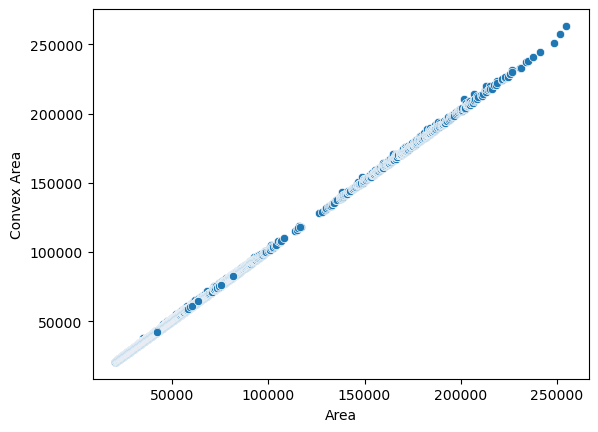

In [10]:
# Checking the realtion between the area and convex area variable
sns.scatterplot(x=df['Area'],y=df['ConvexArea'],data=df)
plt.xlabel('Area')
plt.ylabel('Convex Area')
plt.show()

In [11]:
# dropping all the data where Convex Area is missing
non_missing_df=df.dropna(subset='ConvexArea')
non_missing_df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [12]:
non_missing_df.shape

(12808, 17)

In [13]:
X=non_missing_df['Area']
y=non_missing_df['ConvexArea']

In [14]:
# importing linear regressor for prediciton
from sklearn.linear_model import LinearRegression

In [15]:
# converting 1D array to 2D array 
X=np.array(X).reshape(-1,1)

In [16]:
# fitting the feature and traget variables to linear model
lr=LinearRegression()
lr.fit(X,y)

LinearRegression()

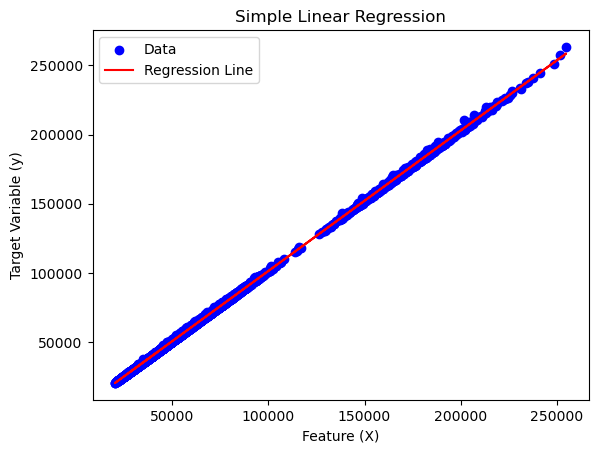

In [17]:
# prediciting the target varibale (Convex Area)
predictions=lr.predict(X)

# plotting the actual Convex area values and predicted values
plt.scatter(X, y, color='blue', label='Data')
plt.plot(X, predictions, color='red', label='Regression Line')
plt.xlabel('Feature (X)')
plt.ylabel('Target Variable (y)')
plt.title('Simple Linear Regression')
plt.legend()
plt.show()

In [18]:
# finding the indices for missing Convex area values
missing_ConvexAre=df['ConvexArea'].isnull()
missing_ConvexArea=np.array(df[df['ConvexArea'].isnull()]['Area']).reshape(-1,1)

In [19]:
missing_ConvexAre

0        False
1        False
2        False
3        False
4        False
         ...  
13606     True
13607     True
13608    False
13609    False
13610    False
Name: ConvexArea, Length: 13611, dtype: bool

In [20]:
# predicting the convex area values using the linear model
predictions_convexArea= lr.predict(missing_ConvexArea)

In [21]:
predictions_convexArea.shape

(803,)

In [22]:
# filling missing values with the predicted values
df.loc[missing_ConvexAre,'ConvexArea']=predictions_convexArea

<AxesSubplot:xlabel='ConvexArea', ylabel='Area'>

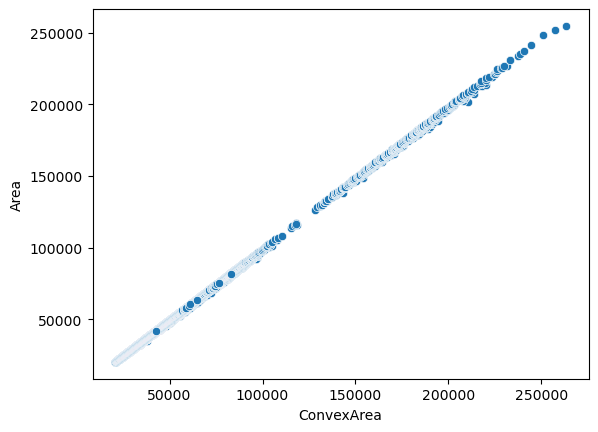

In [23]:
# plotting the convex area with area feature to check whether still linear or not
sns.scatterplot(x=df['ConvexArea'],y=df['Area'])

In [24]:
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

* All missing values are filled in with the help of availabe formulas and linear model

## 5. Exploratory Data Analysis (EDA)

### Univariate Analysis

In [25]:
df.columns,df.dtypes

(Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
        'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
        'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
        'ShapeFactor3', 'ShapeFactor4', 'Class'],
       dtype='object'),
 Area                 int64
 Perimeter          float64
 MajorAxisLength    float64
 MinorAxisLength    float64
 AspectRation       float64
 Eccentricity       float64
 ConvexArea         float64
 EquivDiameter      float64
 Extent             float64
 Solidity           float64
 roundness          float64
 Compactness        float64
 ShapeFactor1       float64
 ShapeFactor2       float64
 ShapeFactor3       float64
 ShapeFactor4       float64
 Class               object
 dtype: object)

#### Target Variable (Class)

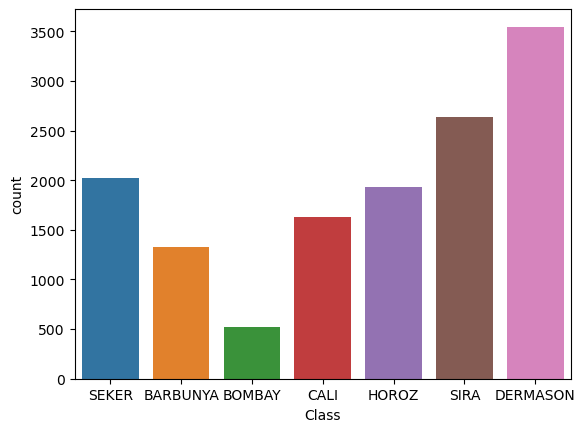

In [26]:
# Frequency of different classes in the datasets
sns.countplot(x='Class',data=df)
plt.show()

* **Dermason** has high frequency followed by **Sira** and **Seker**
* **Bombay** class has the least frequency
****

In [27]:
def univariate_analysis(feature_name):
    
    fig,axes = plt.subplots(nrows=2,figsize=(10,5),gridspec_kw = {"height_ratios": (.25, .75)},sharex=True)
    
    sns.boxplot(x=feature_name,data=df,ax=axes[0])
    sns.histplot(x = feature_name,data=df,ax=axes[1])
    axes[1].axvline(np.mean(df[feature_name]),color='red',label='mean')
    axes[1].axvline(np.median(df[feature_name]),color='y',label='median')
    plt.legend()
    plt.xlabel(feature_name)
    print('Mean: ',np.mean(df[feature_name]))
    print('Median: ',np.median(df[feature_name]))
    plt.show()
    

Mean:  53048.284549261625
Median:  44652.0


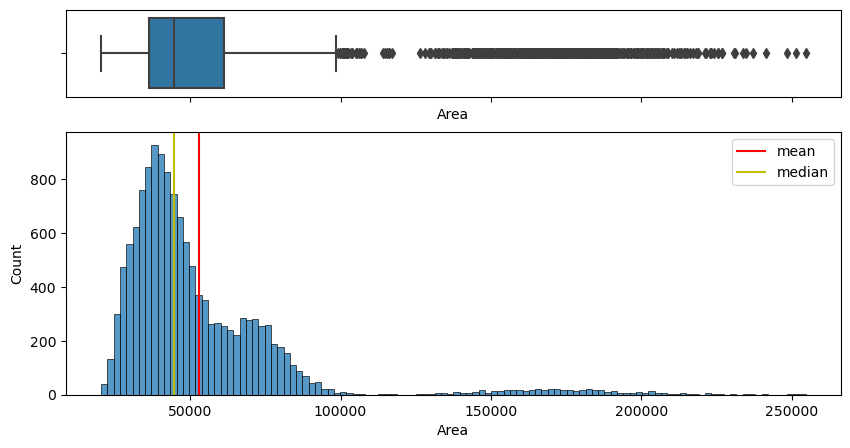

In [28]:
univariate_analysis('Area')

* Area distribution is right skewed and we can observe there are huge number of outliers even after.
* As number of outliers are huge in number, we are not removing any.

Mean:  855.283458599662
Median:  794.9409999999999


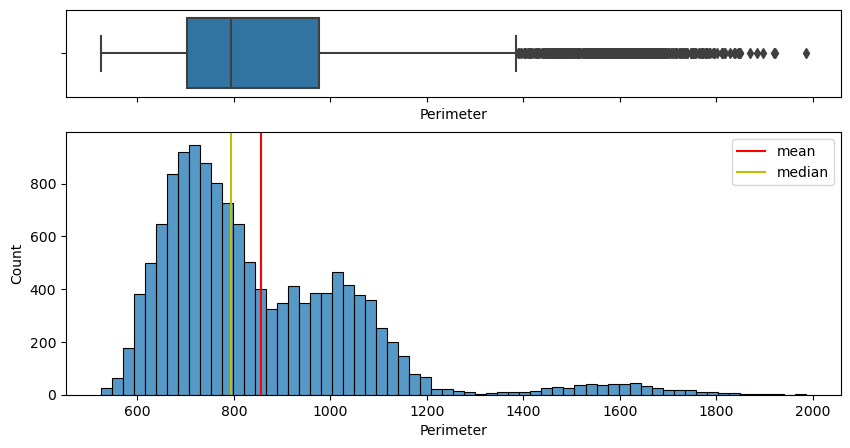

In [29]:
univariate_analysis('Perimeter')

* The Perimeter distribution is right skewed and we can observe huge number of outliers.
* As the number are outliers are more, we are not removing any.

Mean:  320.1418673032454
Median:  296.88336688673496


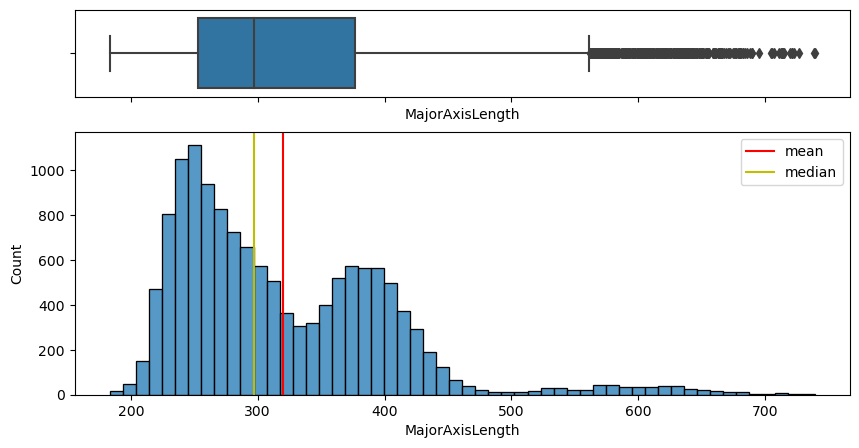

In [30]:
univariate_analysis('MajorAxisLength')

* Major axis length distribution is right skewed with large number of outliers

Mean:  202.2707140825082
Median:  192.43173331431825


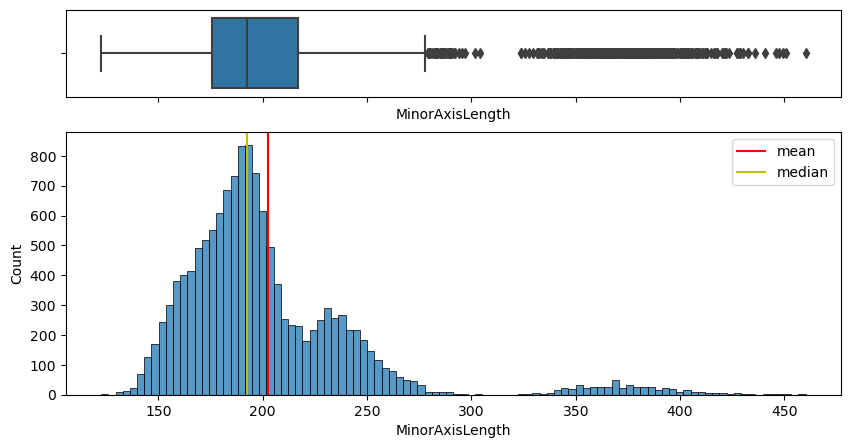

In [31]:
univariate_analysis('MinorAxisLength')

* Minor axis length is right skewed and there are large number of outliers present
* There is a gap in the outliers from 300 to 350 

Mean:  1.5832419790174213
Median:  1.5511236655616438


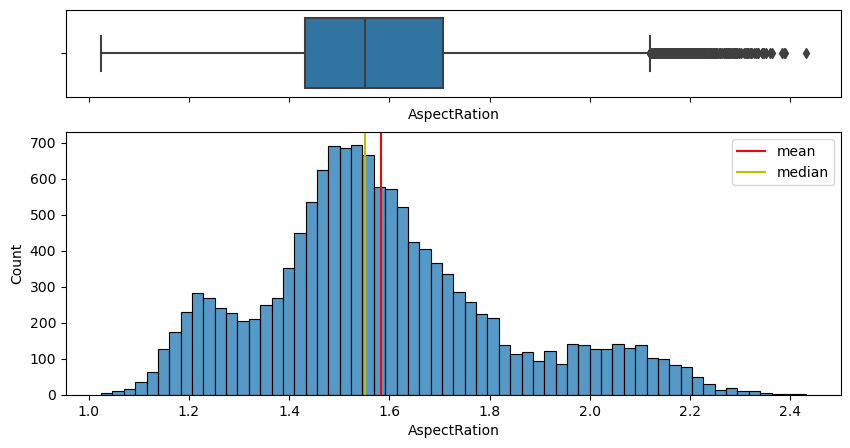

In [32]:
univariate_analysis('AspectRation')

* AspectRation is normally distributed with significant number of outliers present 

Mean:  0.7508949293727165
Median:  0.7644408063975098


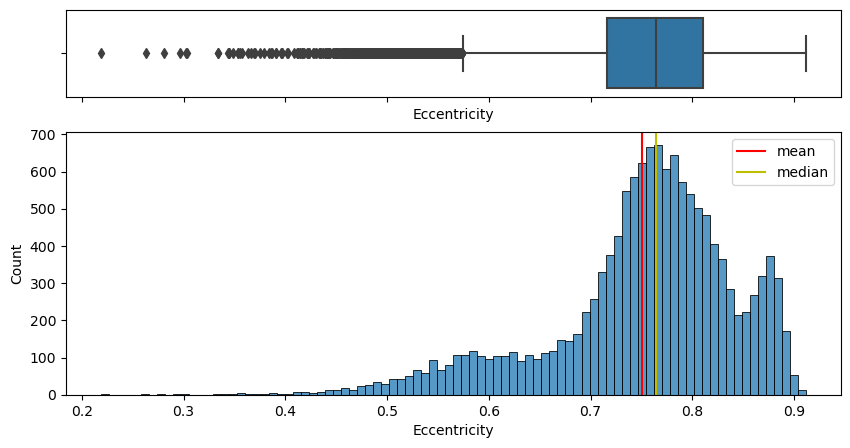

In [33]:
univariate_analysis('Eccentricity')

* Eccentricity is negatively skewed and has large number of outliers present
* There is one outliers significant far from the remaining data, we will remove that

In [34]:
df['Eccentricity'].sort_values()

521     0.218951
1501    0.262774
1305    0.280937
85      0.296721
1418    0.302576
          ...   
6929    0.906126
6989    0.907712
5933    0.908048
6218    0.908167
6186    0.911423
Name: Eccentricity, Length: 13611, dtype: float64

In [35]:
df.drop(df[df['Eccentricity']<0.25].index,inplace=True)

In [36]:
df['Eccentricity'].sort_values()

1501    0.262774
1305    0.280937
85      0.296721
1418    0.302576
104     0.303273
          ...   
6929    0.906126
6989    0.907712
5933    0.908048
6218    0.908167
6186    0.911423
Name: Eccentricity, Length: 13610, dtype: float64

Mean:  0.7509340141387723
Median:  0.764443563138133


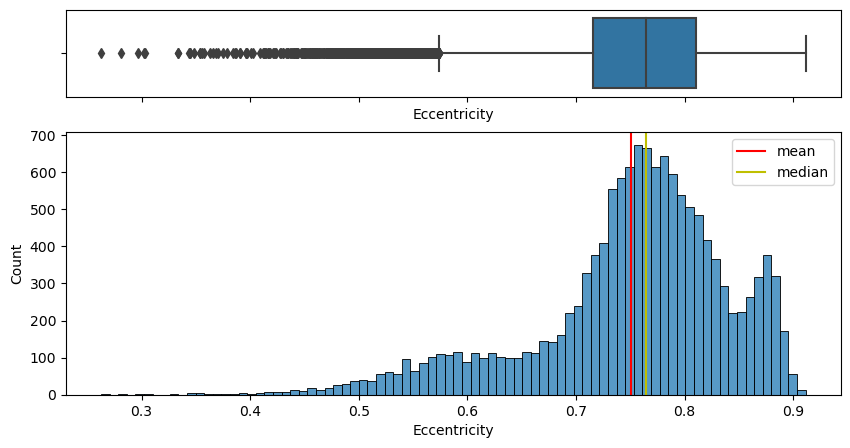

In [37]:
univariate_analysis('Eccentricity')

Mean:  53768.8489820279
Median:  45203.63588735509


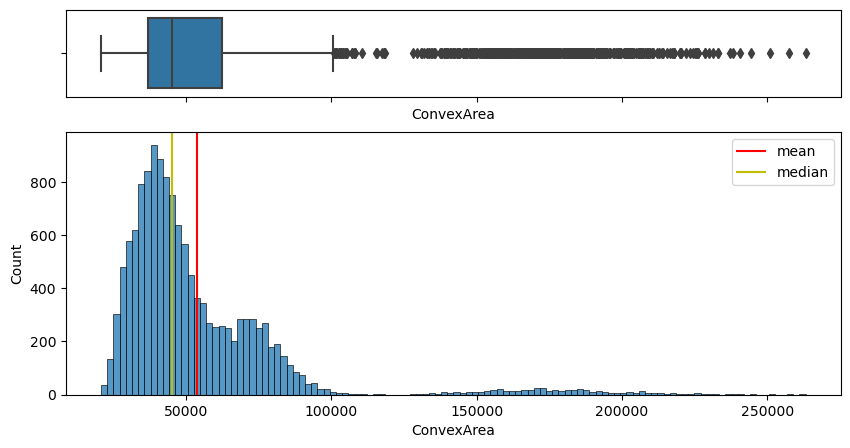

In [38]:
univariate_analysis('ConvexArea')

* Convex area is right skewed and there are large number of outliers 
* The outliers values greater than 250000 will be removed

Mean:  53723.98520213123
Median:  45200.0


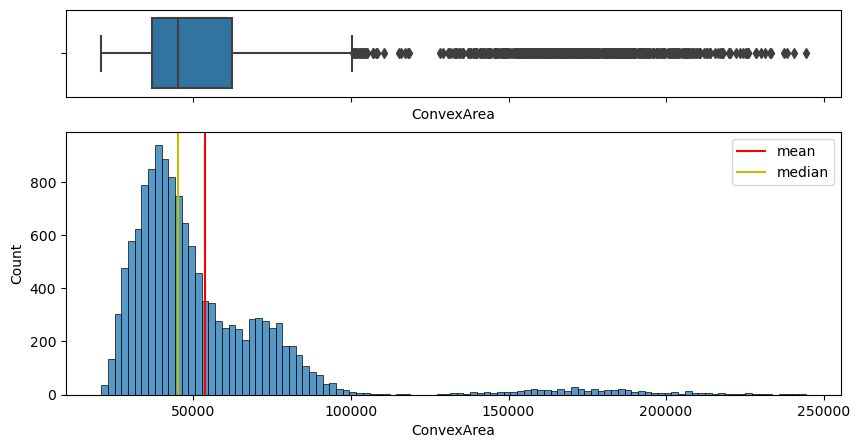

In [39]:
df.drop(df[df['ConvexArea']>250000].index,inplace=True)
univariate_analysis('ConvexArea')

Mean:  252.99801181403132
Median:  238.4353558345946


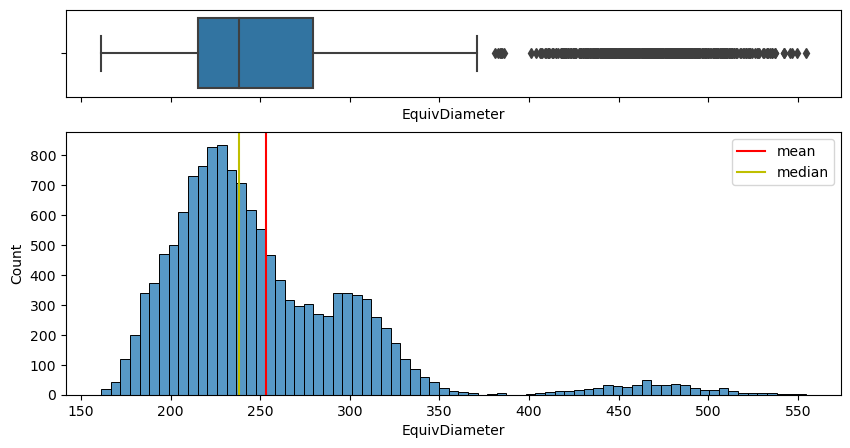

In [40]:
univariate_analysis('EquivDiameter')

* Equivalent diameter is slightly right skewed and has large number of outliers

Mean:  0.7497231881616333
Median:  0.7598119568242971


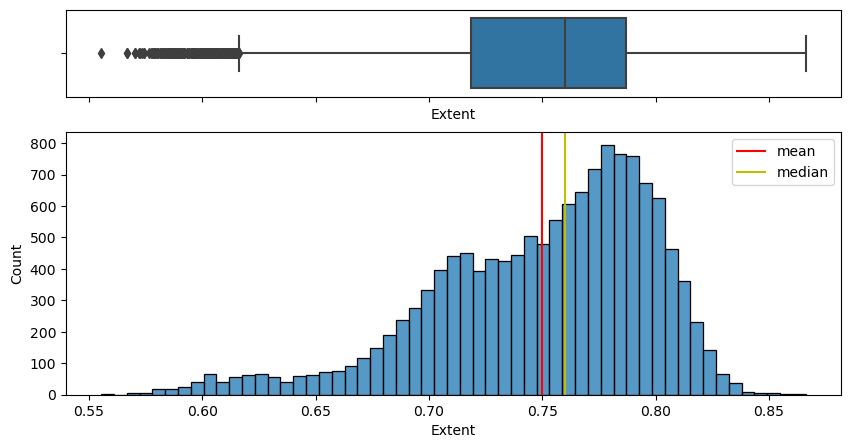

In [41]:
univariate_analysis('Extent')

* Extent is left skewed and has significant number of outliers.

Mean:  0.9871448240146128
Median:  0.9882829984991706


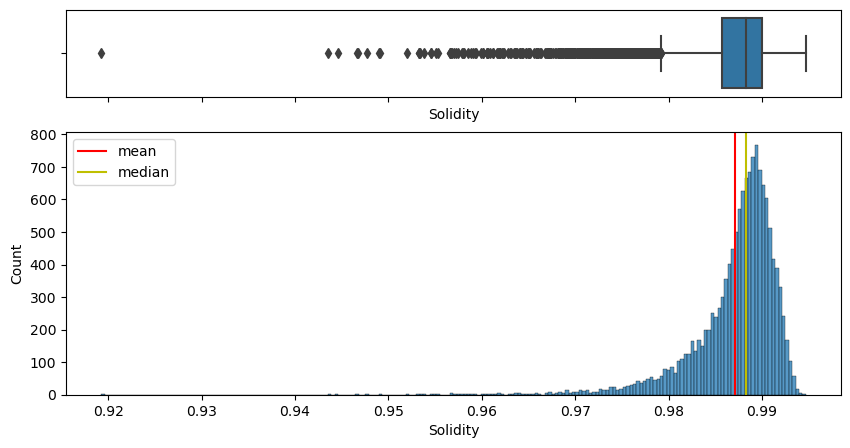

In [42]:
univariate_analysis('Solidity')

* Solidity is left skewed and there are huge number of outliers present.
* There is single outlier that is less than 0.92 which is very far from others, we shall remove it

Mean:  0.9871498143620279
Median:  0.9882836951673333


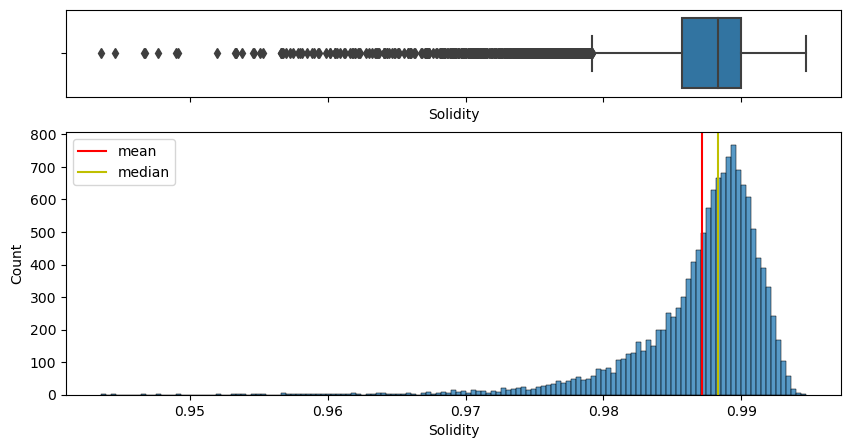

In [43]:
df.drop(df[df['Solidity']<0.92].index,inplace=True)
univariate_analysis('Solidity')

Mean:  0.8732981242406518
Median:  0.883167572300904


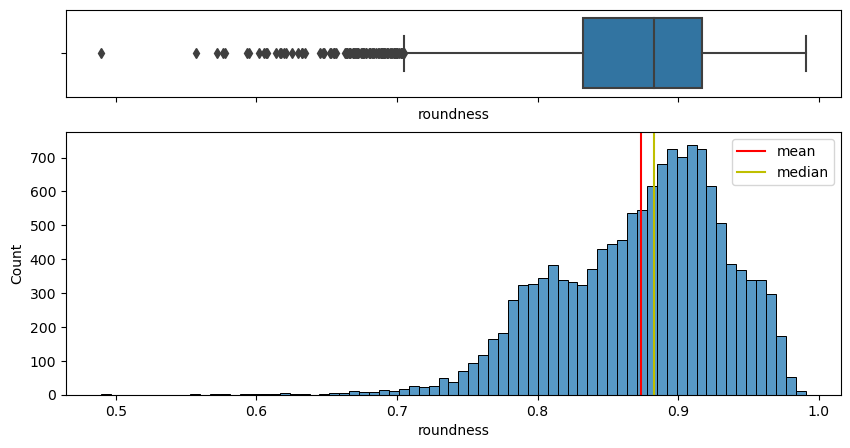

In [44]:
univariate_analysis('roundness')

* Roundness is left skewed and there are significant number of outliers present
* There is one outlier less than 0.5 present, which is very far. We shall remove it

Mean:  0.8733263256274947
Median:  0.8831680830806361


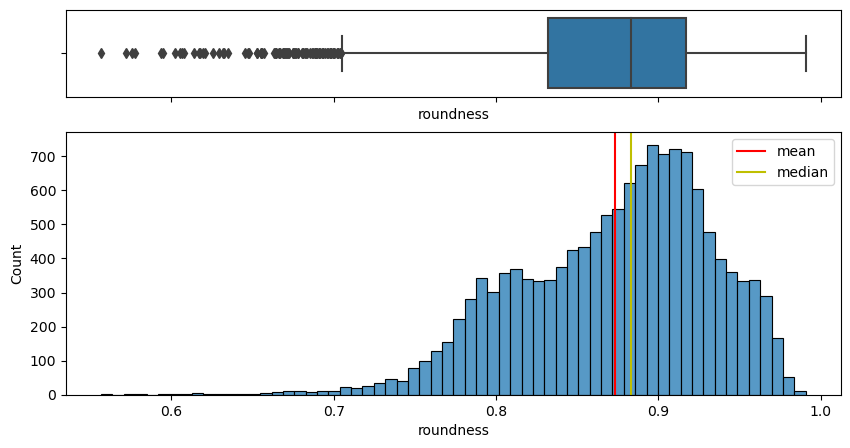

In [45]:
df.drop(df[df['roundness']<0.5].index,inplace=True)
univariate_analysis('roundness')

Mean:  0.7998505199599409
Median:  0.8012766840140727


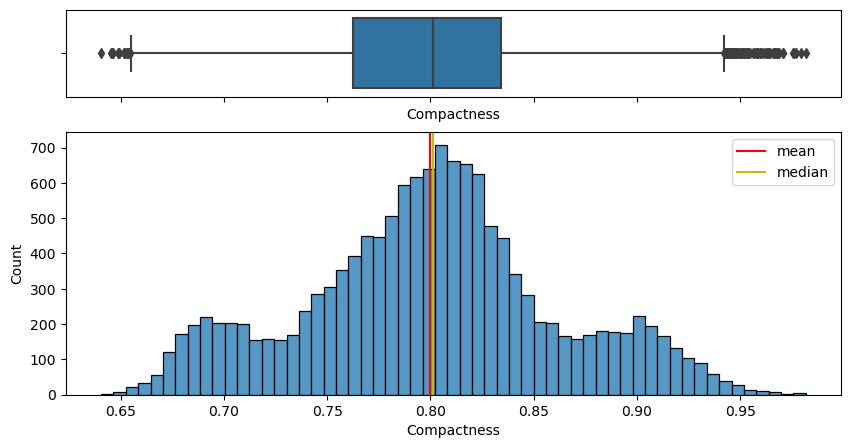

In [46]:
univariate_analysis('Compactness')

* Compactness is normally distributed with few outliers present on both extremes of the distribution

Mean:  0.006564327772821826
Median:  0.0066455875494565


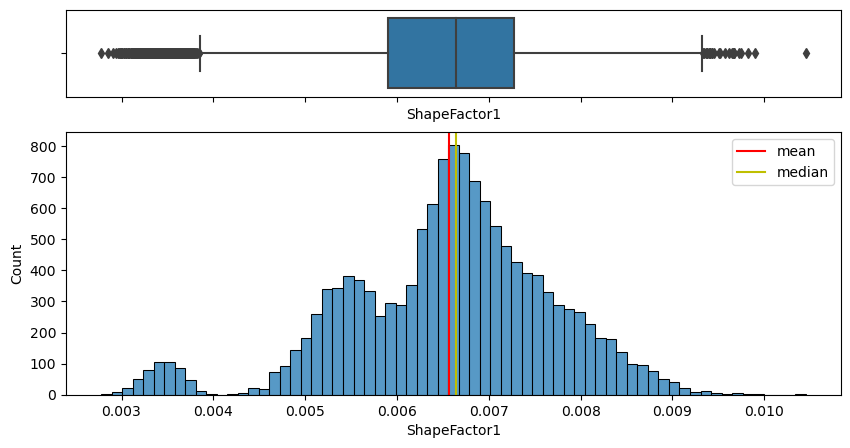

In [47]:
univariate_analysis('ShapeFactor1')

* Shapefactor 1 is normally distributed (not perfect normal deistribution) with few outliers at both extremes
* There is one extreme outlier after 0.010, we shall remove it

Mean:  0.006564042059682194
Median:  0.00664538100422375


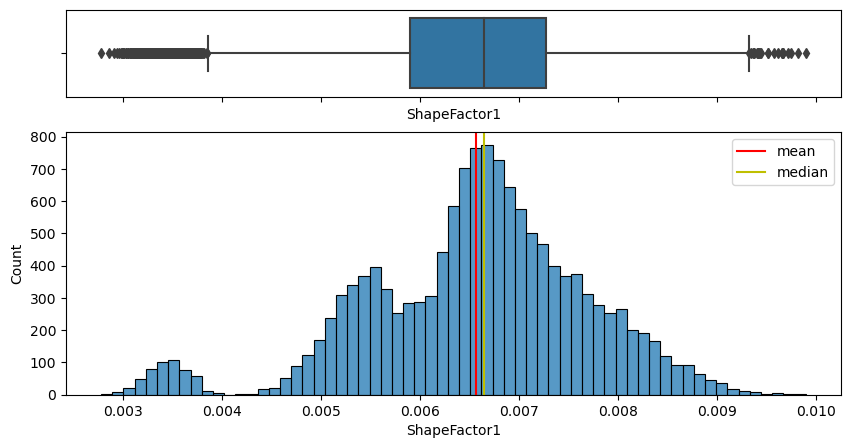

In [48]:
df.drop(df[df['ShapeFactor1']>0.010].index,inplace=True)
univariate_analysis('ShapeFactor1')

Mean:  0.0017159979767950488
Median:  0.0016937148339197


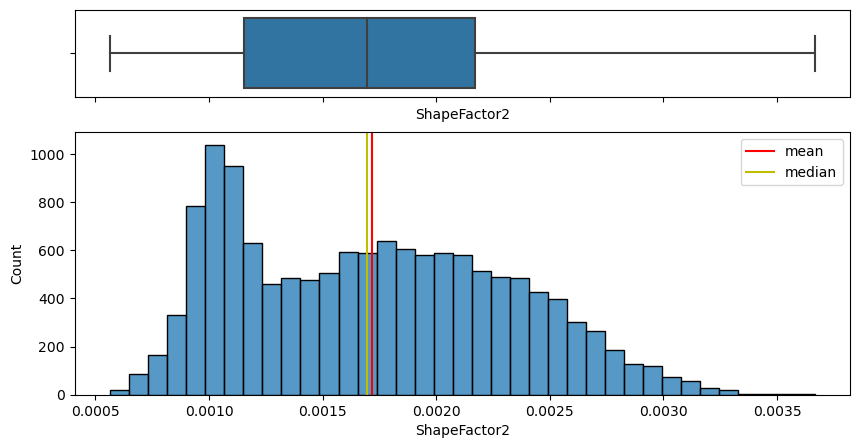

In [49]:
univariate_analysis('ShapeFactor2')

* Shapefactor 2 is normally distributed with some high frequency on the left and no outliers

Mean:  0.6435789853859238
Median:  0.6420476033935674


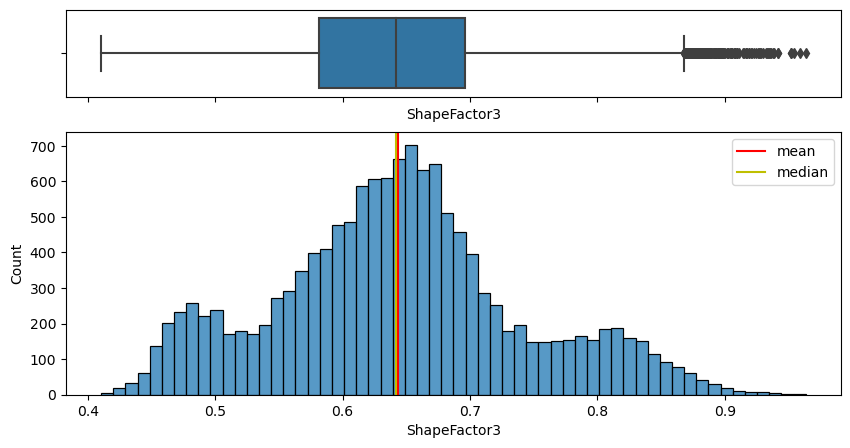

In [50]:
univariate_analysis('ShapeFactor3')

* Shape factor 4 is normally distributed with some outliers at the higher extreme

Mean:  0.9950698099915107
Median:  0.9963872452921584


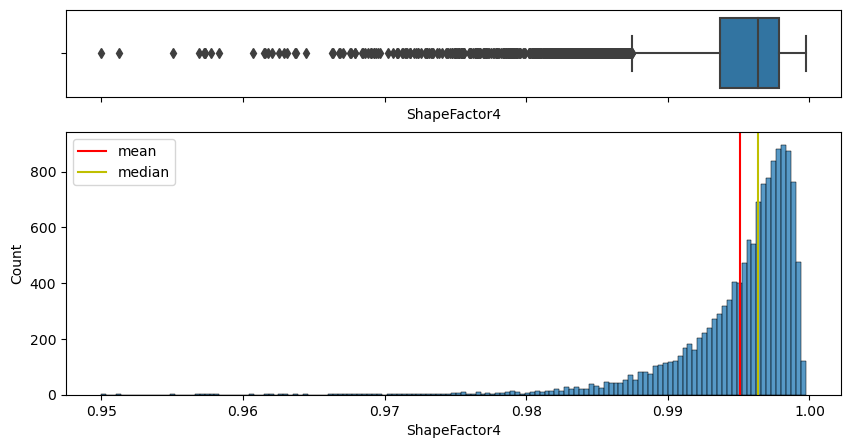

In [51]:
univariate_analysis('ShapeFactor4')

* Shape factor 4 is left skewed with huge number of outliers present
* There are two outliers that are significantly far from the distribution, we shall remove it

In [52]:
df['ShapeFactor4'].sort_values()

5757     0.949990
6305     0.951239
6301     0.955032
7138     0.956867
6877     0.957233
           ...   
439      0.999674
1102     0.999681
654      0.999707
11245    0.999709
394      0.999733
Name: ShapeFactor4, Length: 13604, dtype: float64

Mean:  0.9950763465650515
Median:  0.996387957007311


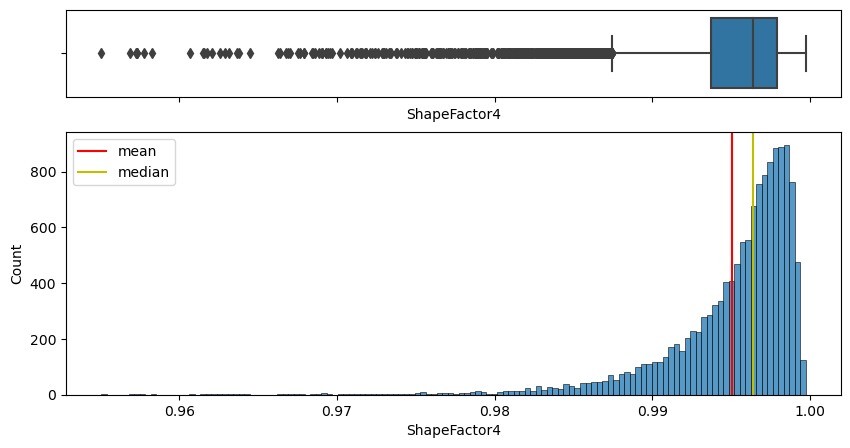

In [53]:
df.drop(df[df['ShapeFactor4']<0.955].index,inplace=True)
univariate_analysis('ShapeFactor4')

### Bivariate Analysis

In [54]:
df.columns,df.dtypes

(Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
        'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
        'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
        'ShapeFactor3', 'ShapeFactor4', 'Class'],
       dtype='object'),
 Area                 int64
 Perimeter          float64
 MajorAxisLength    float64
 MinorAxisLength    float64
 AspectRation       float64
 Eccentricity       float64
 ConvexArea         float64
 EquivDiameter      float64
 Extent             float64
 Solidity           float64
 roundness          float64
 Compactness        float64
 ShapeFactor1       float64
 ShapeFactor2       float64
 ShapeFactor3       float64
 ShapeFactor4       float64
 Class               object
 dtype: object)

In [55]:
def bivariate_analysis(feature_name):
    
    plt.figure(figsize=(12,6))
    sns.boxplot(x='Class',y=feature_name,data=df)
    plt.xlabel('Class')
    plt.ylabel(feature_name)
    plt.show()

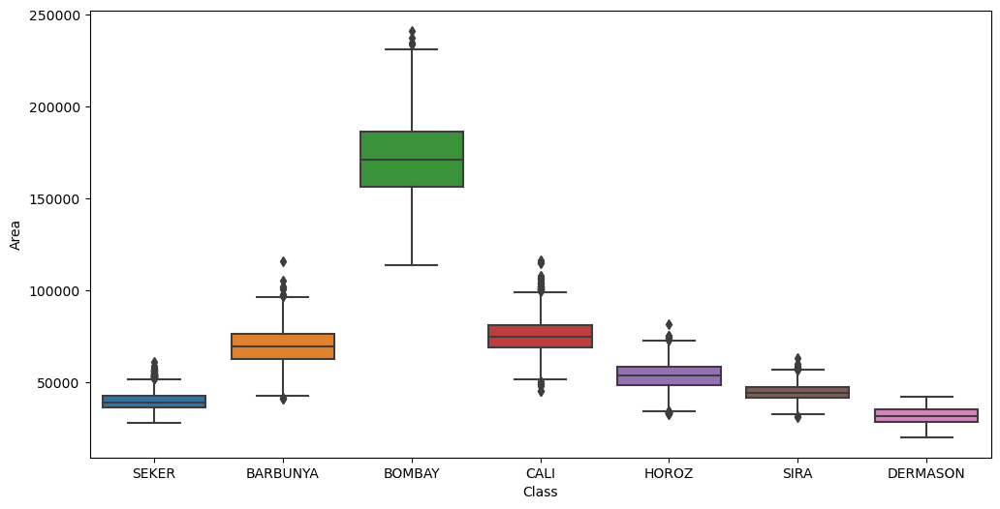

In [56]:
bivariate_analysis('Area')

* **BOMBAY** class beans has area larger than any other classes and more variable range.
* **BARBUNYA** and **CALI** class beans have almost same range of areas.
* **DERMASON** class beans have the least area.

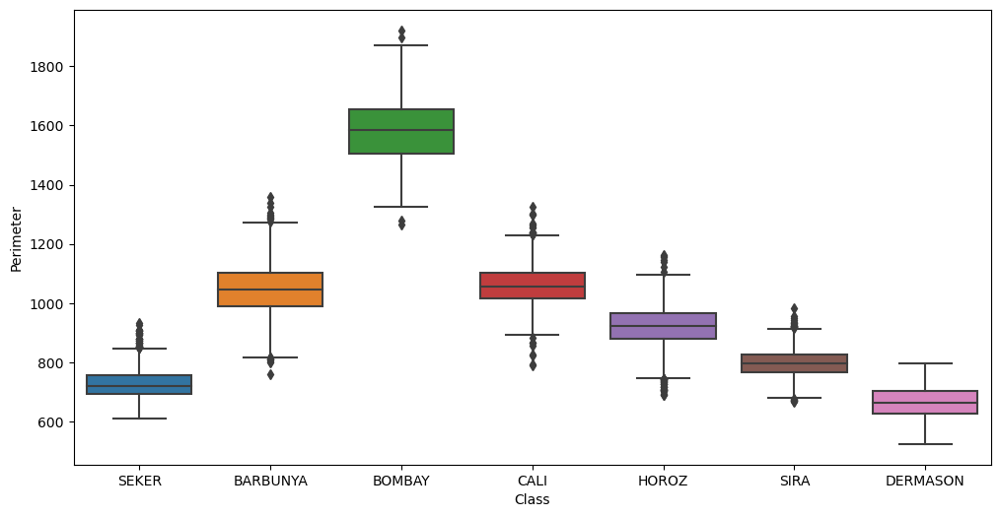

In [57]:
bivariate_analysis('Perimeter')

* Perimeter behaviour of different class aligns with area, **BOMBAY** class beans have highest perimeter
* Area and Perimeter are positively related to each other

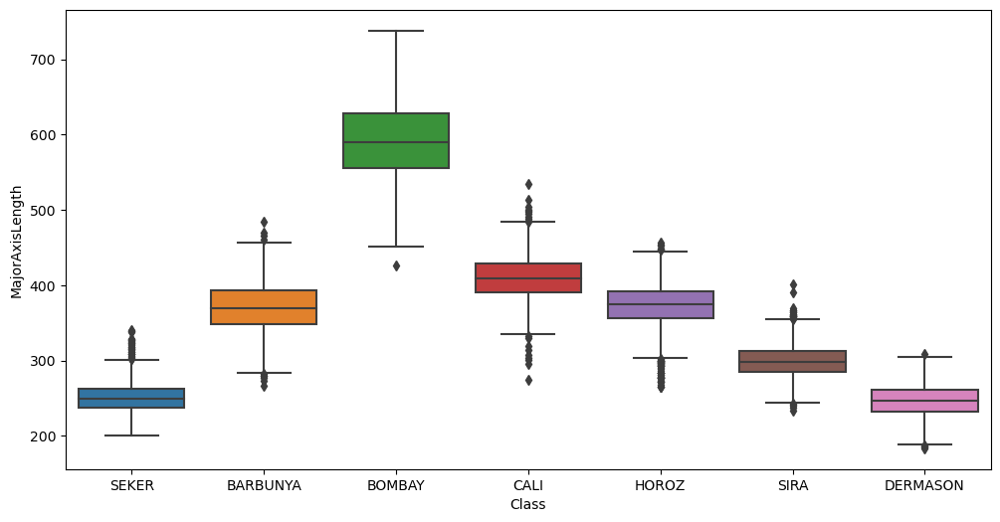

In [58]:
bivariate_analysis('MajorAxisLength')

* Major axis also followes the same trend as area and perimeter.
* We can say that, class with higher area has higher major axis length and perimeter

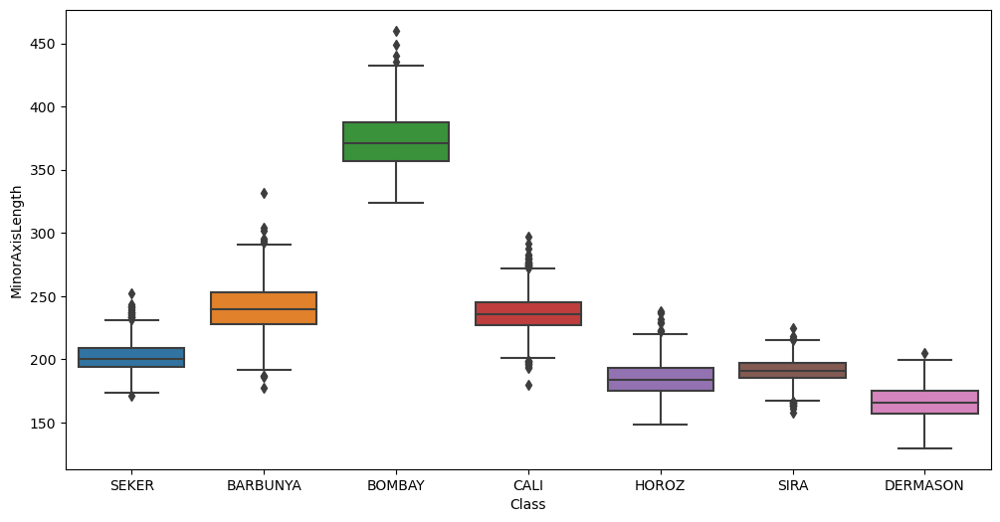

In [59]:
bivariate_analysis('MinorAxisLength')

* Minor axis length also the follows the same patters as major axis

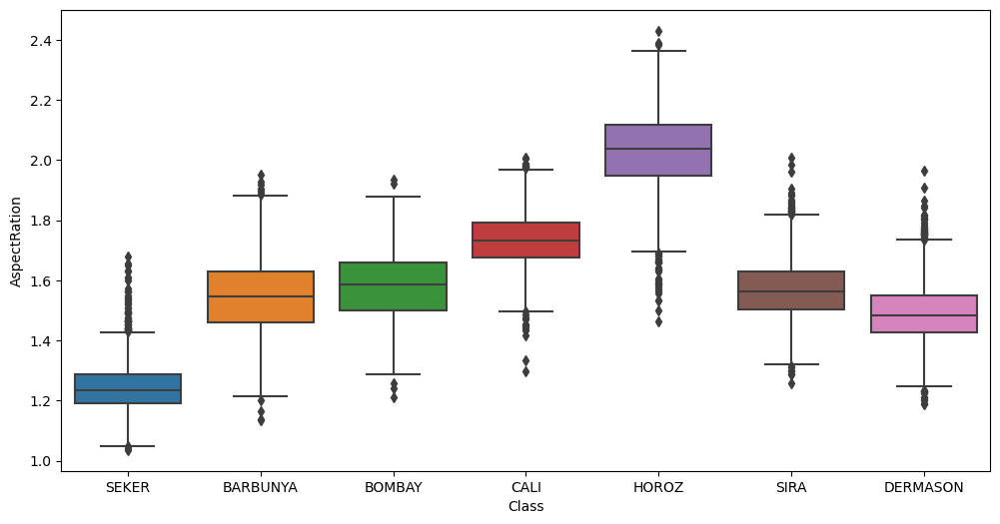

In [60]:
bivariate_analysis('AspectRation')

* Aspect ration of **HOROZ** class beans is higher than any other class.
* **SEKER** class beans have the least aspect ratio

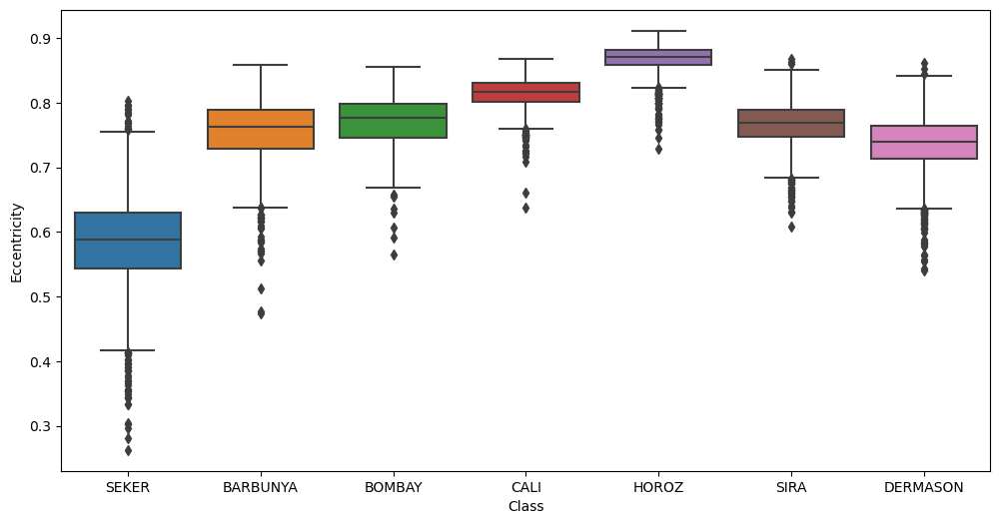

In [61]:
bivariate_analysis('Eccentricity')

* **HOROZ** has the highest eccentricity but less variance in data
* **SEKER** has the least eccentricity with laege variance of data
* BARBUNYA, BOMBAY, SIRA and DERMASON are of same range 

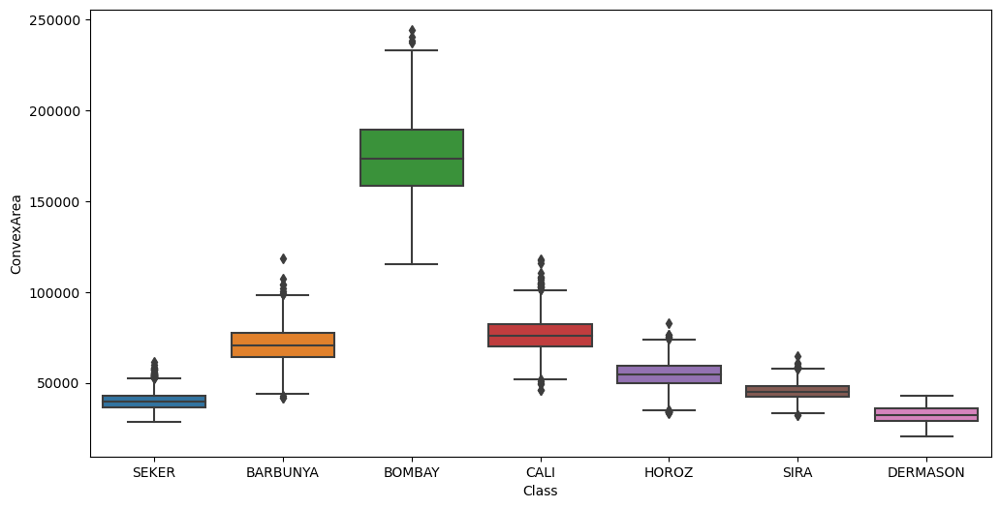

In [62]:
bivariate_analysis('ConvexArea')

* Convex area has same pattern as Area feature, as convex area is derived from area

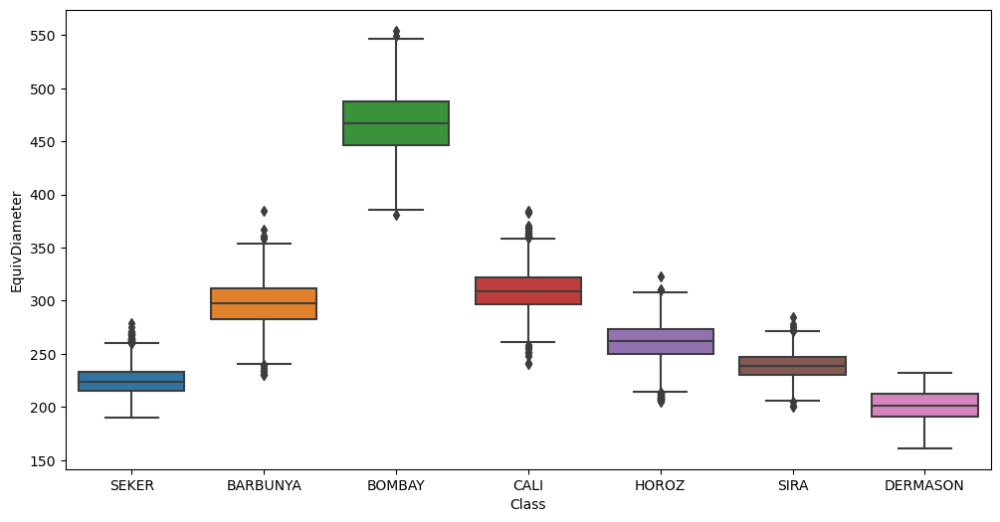

In [63]:
bivariate_analysis('EquivDiameter')

* Equivalent diameter has the same representation of the data as Area feature

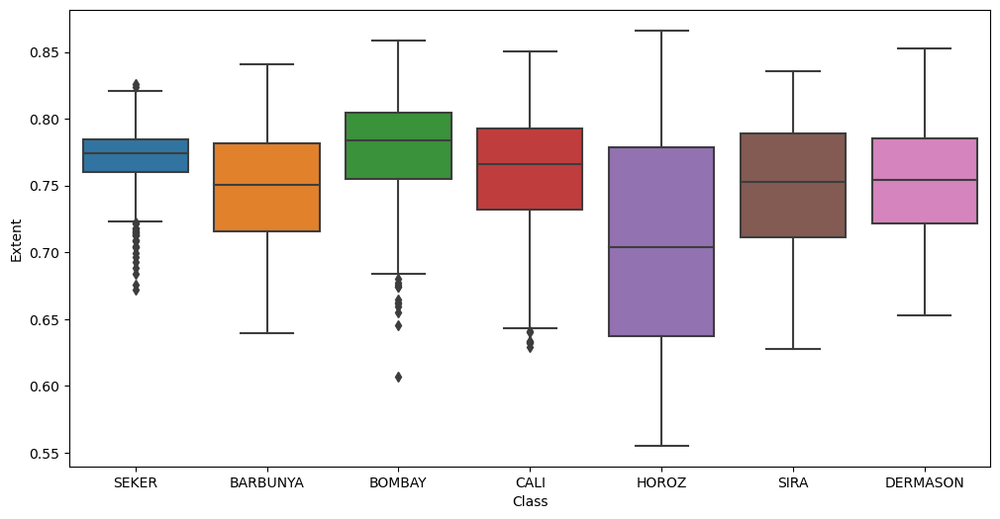

In [64]:
bivariate_analysis('Extent')

* Mean value of extent is ranging from 0.7-0.8 and all classes are around the same values
* **HOROZ** class beans have slightly high varince than other classes

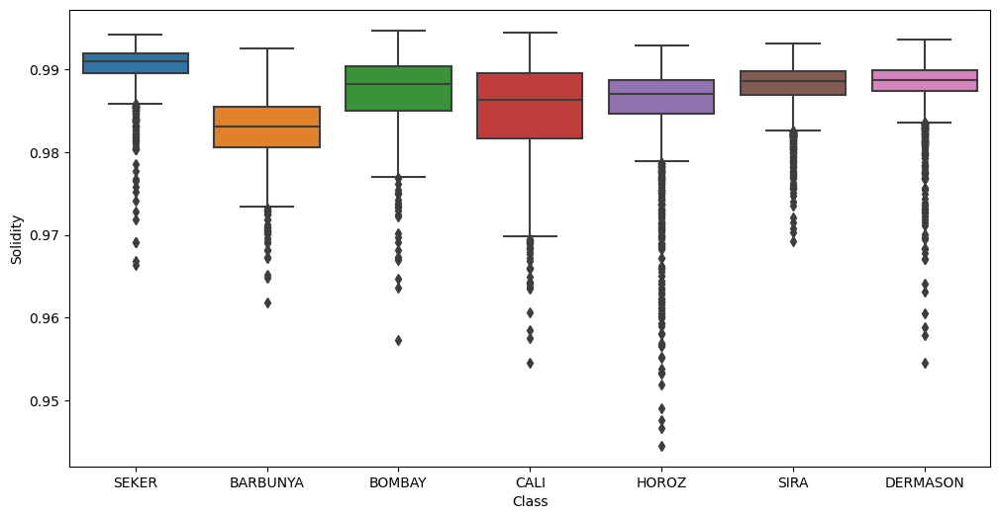

In [65]:
 bivariate_analysis('Solidity')

* Mean of Solidity is ranging from 0.98 to 0.99 and all class are majorly around these values
* We can observe more number of outliers in this visualization, especially for **HOROZ** class beans

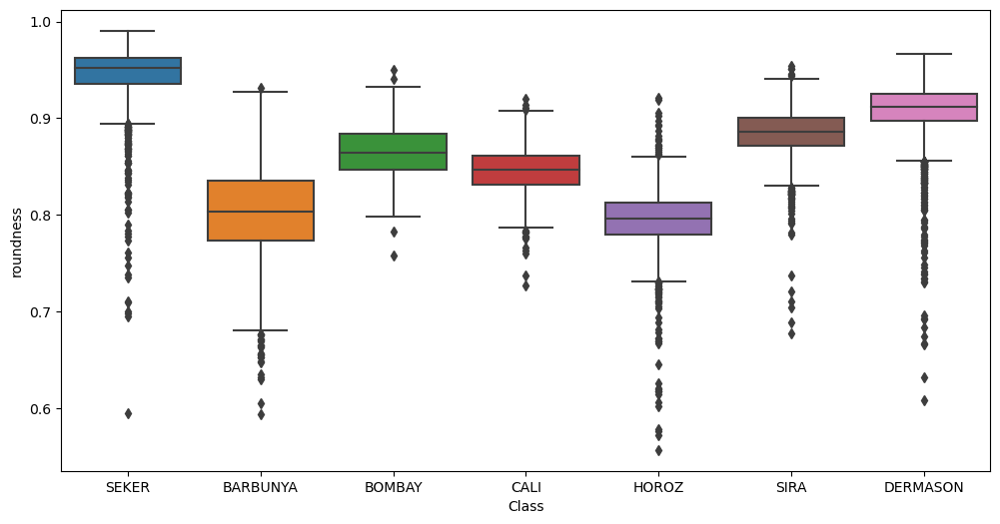

In [66]:
bivariate_analysis('roundness')

* Roundness is higher for **SEKER** class beans and **BARBUNYA** and **HOROZ** have the least

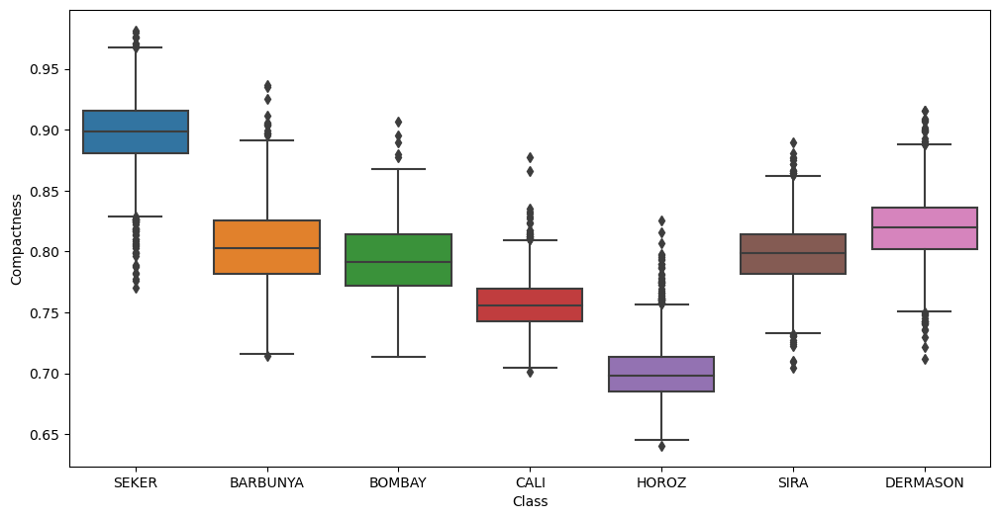

In [67]:
bivariate_analysis('Compactness')

* Compactness is least for **HOROZ** class beans and highest for **SEKER**, remaining classes are almost in same range

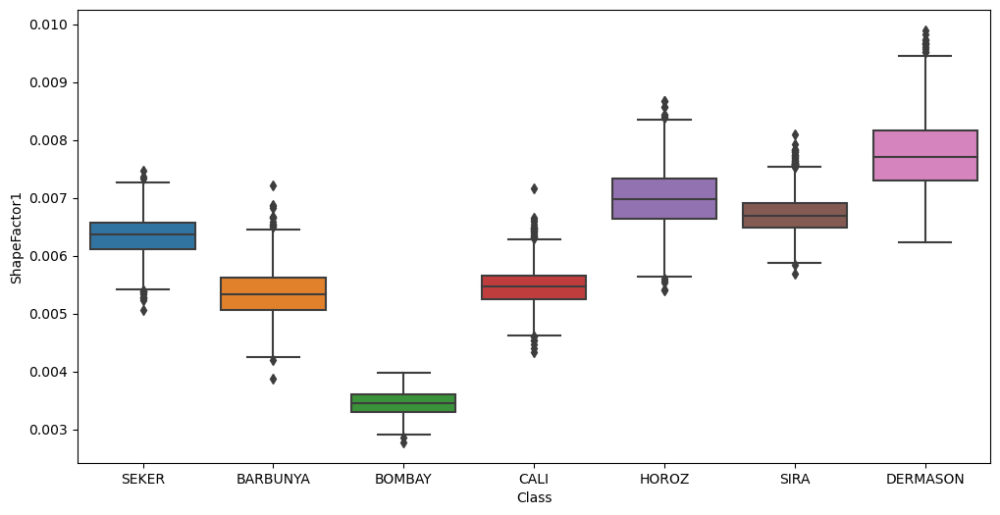

In [68]:
bivariate_analysis('ShapeFactor1')

* Shapefactor 1 is least for **BOMBAY** class beans

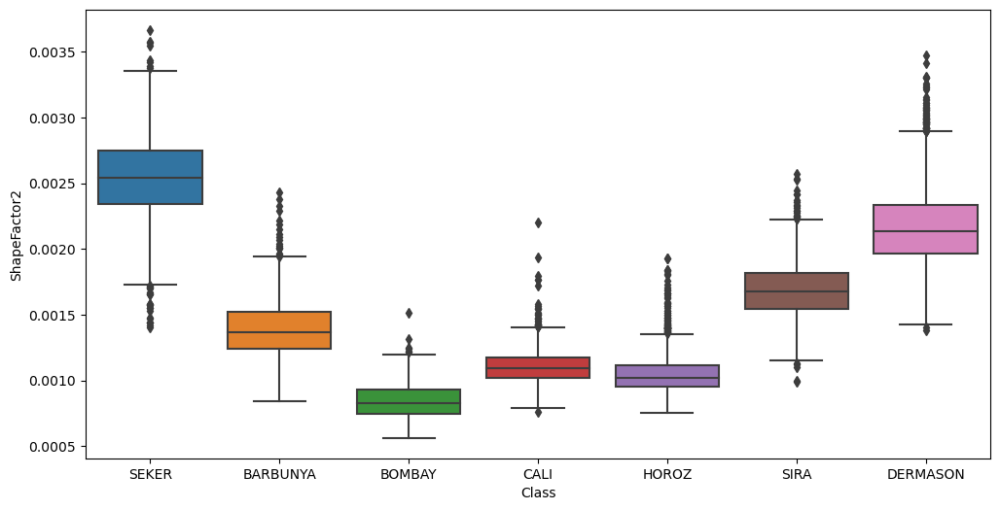

In [69]:
bivariate_analysis('ShapeFactor2')

* **BOMBAY** class beans have the least shapefactor2 followed by HOROZ and CALI classes

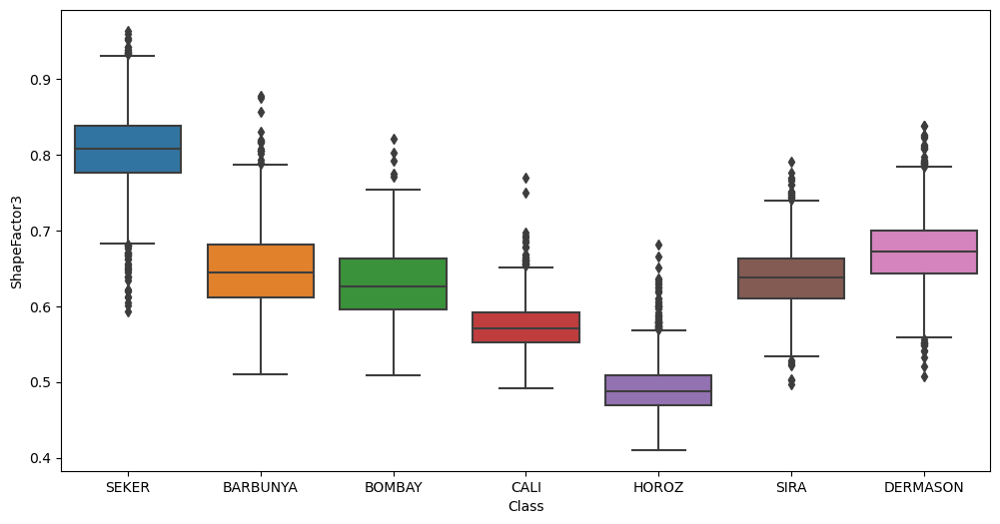

In [70]:
bivariate_analysis('ShapeFactor3')

* **HOROZ** has the lowest shapefactor 3, followed by CALI

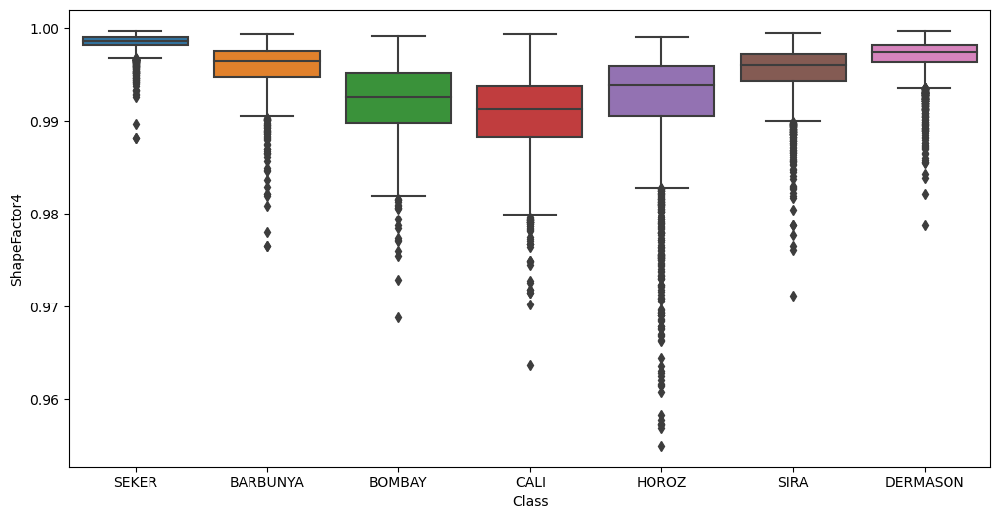

In [71]:
bivariate_analysis('ShapeFactor4')

* Most of data have the Shapefactor 4 range from 0.99 to 1 
* **HOROZ** has the highest number of outliers

<AxesSubplot:>

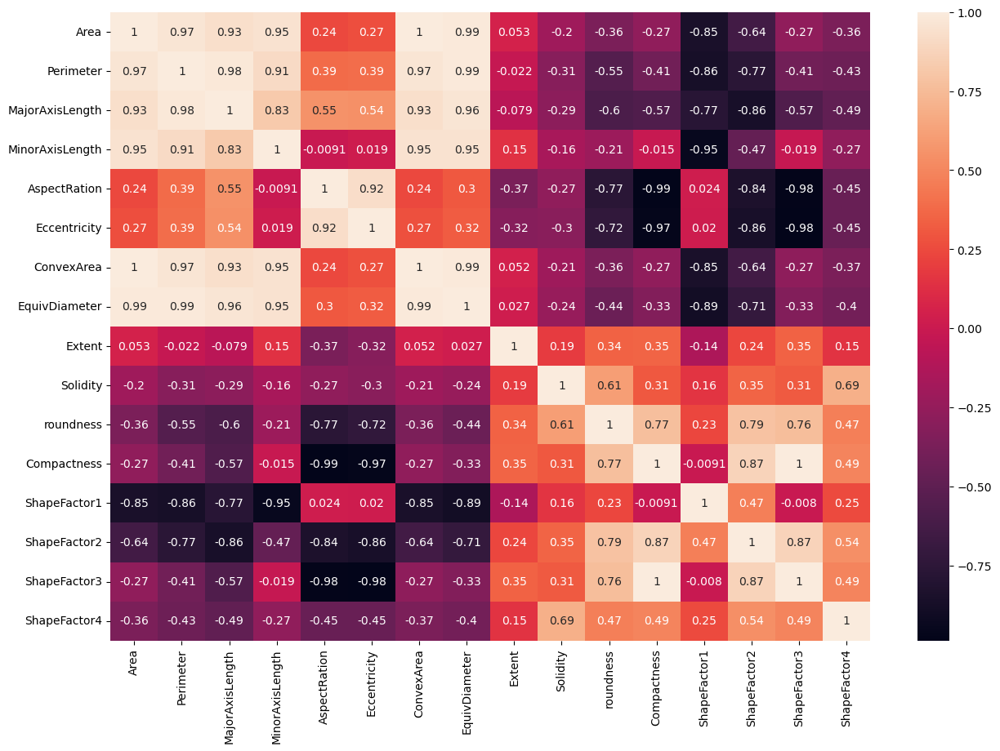

In [72]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True)

* As there are lot of correlations between different features we shall try pair plot for better visulaization

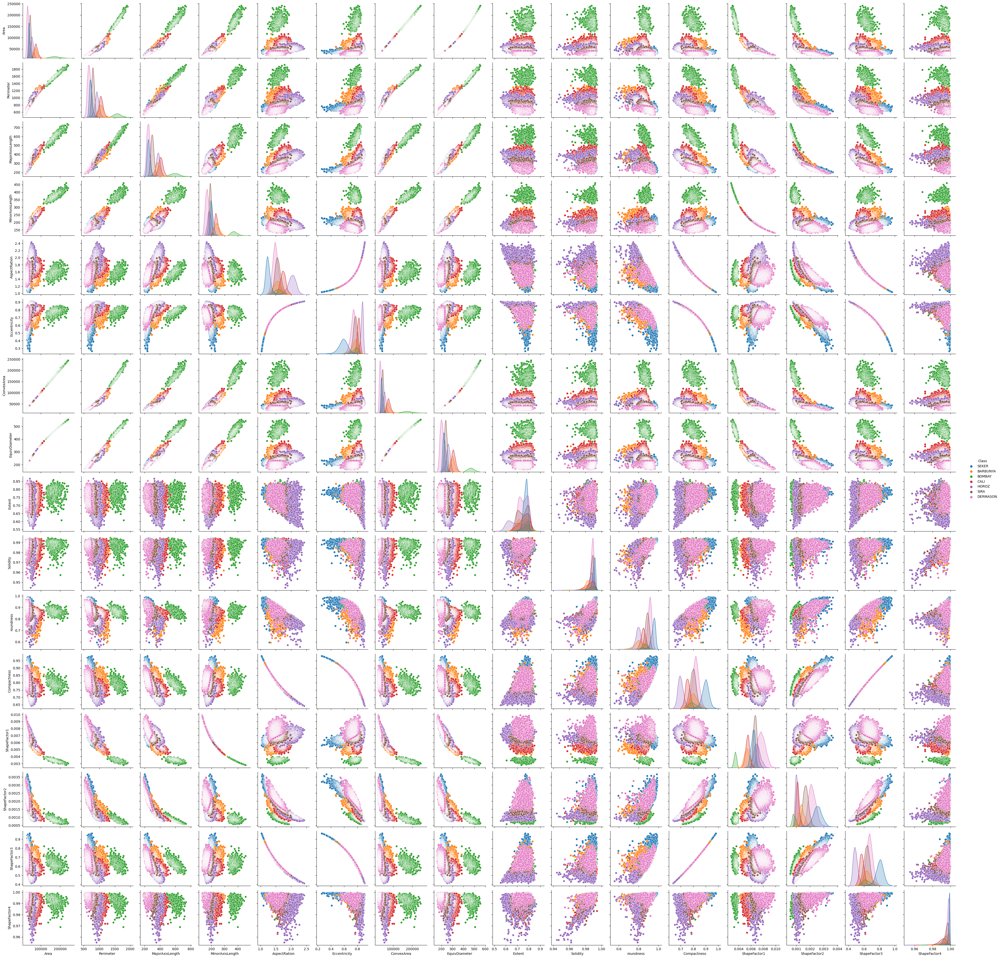

In [214]:
sns.pairplot(data=df,hue='Class')

* From the above pairplot we can say that **BOMBAY** class beans are seperated in most of the features
* We can even say that most og the features are either positively or negatively related to each other

In [72]:
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715.000000,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172.000000,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690.000000,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724.000000,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417.000000,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42648.758471,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42652.819677,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569.000000,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667.000000,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


## 6.Preprocessing the Data

#### Label Encoding the target variable

In [73]:
# importing the Label encoder from sklearn library
from sklearn.preprocessing import LabelEncoder

# creating an instance of label encoder
label_encode= LabelEncoder()

# fitting the target varibale to label encoder
df['Class_label']=label_encode.fit_transform(df['Class'])
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class,Class_label
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER,5
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172.0,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER,5
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER,5
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724.0,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER,5
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER,5


In [74]:
df.Class.value_counts(),df.Class_label.value_counts()

(DERMASON    3544
 SIRA        2636
 SEKER       2025
 HOROZ       1926
 CALI        1630
 BARBUNYA    1322
 BOMBAY       519
 Name: Class, dtype: int64,
 3    3544
 6    2636
 5    2025
 4    1926
 2    1630
 0    1322
 1     519
 Name: Class_label, dtype: int64)


*   BARBUNYA-0
*   BOMBAY   - 1
*   CALI      -2
*   DERMASON  -3
*   HOROZ     -4
*   SEKER     -5
*   SIRA      -6 
* These are the label encoded values of the different classes of beans

## 7. Modelling 

#### Assumptions
* As this is a classification model, for evaluation **accuracy score** and **f1 score** are chosen
* Beacuse of mult class clasification, in f1 score the average is set to weighted for all models
* For grid search only n_estimators, max_depth and max_estimators are considered for bagging and boosting models

In [75]:
# importing libraries
from sklearn.model_selection import train_test_split,KFold,GridSearchCV
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.metrics import accuracy_score,f1_score,classification_report
from xgboost import XGBClassifier

In [76]:
# Creating X fetures from the dry beans dataset
X= df.drop(['Class','Class_label'],axis=1)

# seperating the target variable (Class_label) to y
y=df['Class']

In [77]:
# splitting data into train and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,stratify=y, random_state=101)
X_train.shape,X_test.shape

((10201, 16), (3401, 16))

In [78]:
y_train.shape,y_test.shape

((10201,), (3401,))

In [79]:
# Label encoding the target variable y
label_encode=LabelEncoder()
y_train =label_encode.fit_transform(y_train)
y_test = label_encode.transform(y_test)

In [80]:
y_train.shape,y_test.shape

((10201,), (3401,))

In [81]:
# Scaling the features for better performance
scalar= StandardScaler()
X_train_scaled = scalar.fit_transform(X_train)
X_test_scaled = scalar.transform(X_test)

### a) Base Model
For a base model we will try to consider the mode of the target variable and see the evaluation metrics

In [82]:
mode_value= np.bincount(y_train).argmax()
model_pred= np.repeat(mode_value,len(y_test))


In [83]:
# Evaluation metrics
mode_accuracy = accuracy_score(y_test,model_pred)
mode_f1 = f1_score(y_test,model_pred,average='weighted')

mode_accuracy,mode_f1

(0.2605116142311085, 0.10768056459471059)

* We used average='weighted' as it is a multi class classification model
* The accuracy score and F1 score of base model is very low

### b) Logistic Model

In [84]:
# logistic regression for multi class classification
log_reg = LogisticRegression(multi_class = 'ovr',random_state = 101,penalty = 'none')
log_reg.fit(X_train_scaled,y_train)

# predicting the class with logistic regresssion model
log_train_pred = log_reg.predict(X_train_scaled)
log_test_pred = log_reg.predict(X_test_scaled)



# calculating the accuracy and f1 scores
log_accuracy_train = accuracy_score(y_train,log_train_pred)
log_accuracy_test = accuracy_score(y_test,log_test_pred)

log_f1_score_train = f1_score(y_train,log_train_pred,average = 'weighted')
log_f1_score_test = f1_score(y_test,log_test_pred,average = 'weighted')

print('Train set accuracy score:',log_accuracy_train)
print('Test set accuracy score:',log_accuracy_test)
print('-'*40)
print('Train set f1 score:',log_f1_score_train)
print('Test set f1 score',log_f1_score_test)

Train set accuracy score: 0.9234388785413195
Test set accuracy score: 0.9238459276683328
----------------------------------------
Train set f1 score: 0.9238282378740507
Test set f1 score 0.9243282336936928


* We can see the accuracy score and f1 score for train and test data sets are good.

In [85]:
y_train_class_names = label_encode.inverse_transform(log_test_pred)
y_test_class_names = label_encode.inverse_transform(y_test)

In [86]:
# Classification report for the logistic regression model
print(classification_report(y_test_class_names, y_train_class_names))

              precision    recall  f1-score   support

    BARBUNYA       0.96      0.89      0.93       330
      BOMBAY       1.00      1.00      1.00       130
        CALI       0.93      0.96      0.94       408
    DERMASON       0.93      0.91      0.92       886
       HOROZ       0.96      0.94      0.95       482
       SEKER       0.96      0.94      0.95       506
        SIRA       0.83      0.90      0.86       659

    accuracy                           0.92      3401
   macro avg       0.94      0.93      0.94      3401
weighted avg       0.93      0.92      0.92      3401



* From classification report we can say **BOMBAY** class beans are predicted 100% and followed by **HOROZ** and **SEKER**
* **SIRA** class beans are having the least f1 score 

### c) Logistice model with reguralization

In [87]:
# logistice regression model with L1 regularization
logistic_regression_l1 = LogisticRegression(multi_class = 'ovr', solver = 'liblinear', penalty = 'l1', C = 1.0)
logistic_regression_l1.fit(X_train_scaled, y_train)

y_pred_l1 = logistic_regression_l1.predict(X_test_scaled)

In [88]:
# logistic regression model with L2 regularization
logistic_regression_l2 = LogisticRegression(multi_class = 'ovr', solver = 'lbfgs', penalty = 'l2', C = 1.0)
logistic_regression_l2.fit(X_train_scaled, y_train)

y_pred_l2 = logistic_regression_l2.predict(X_test_scaled)


In [89]:
# evaluation metrics
accuracy_l1 = accuracy_score(y_test, y_pred_l1)
accuracy_l2 = accuracy_score(y_test, y_pred_l2)

f1score_l1 = f1_score(y_test, y_pred_l1,average = 'weighted')
f1score_l2 = f1_score(y_test, y_pred_l2,average = 'weighted')

print('Accuracy score of L1:',accuracy_l1)
print('Accuracy score of L2:',accuracy_l2)
print('-'*40)
print('F1 score of L1:',f1score_l1)
print('F1 score of L2',f1score_l2)

Accuracy score of L1: 0.920317553660688
Accuracy score of L2: 0.9167891796530432
----------------------------------------
F1 score of L1: 0.9208549923281686
F1 score of L2 0.9175697335332236


In [90]:
y_pred_class_names_l1 = label_encode.inverse_transform(y_pred_l1)
y_pred_class_names_l2 = label_encode.inverse_transform(y_pred_l2)
y_test_class_names = label_encode.inverse_transform(y_test)

In [91]:
# Classification report for L1 regularization
print(classification_report(y_test_class_names, y_pred_class_names_l1))

              precision    recall  f1-score   support

    BARBUNYA       0.95      0.89      0.92       330
      BOMBAY       1.00      1.00      1.00       130
        CALI       0.92      0.96      0.94       408
    DERMASON       0.93      0.91      0.92       886
       HOROZ       0.96      0.94      0.95       482
       SEKER       0.96      0.93      0.95       506
        SIRA       0.83      0.89      0.86       659

    accuracy                           0.92      3401
   macro avg       0.94      0.93      0.93      3401
weighted avg       0.92      0.92      0.92      3401



In [92]:
# Classification report for L2 regularization
print(classification_report(y_test_class_names, y_pred_class_names_l2))

              precision    recall  f1-score   support

    BARBUNYA       0.95      0.88      0.91       330
      BOMBAY       1.00      1.00      1.00       130
        CALI       0.93      0.95      0.94       408
    DERMASON       0.93      0.90      0.91       886
       HOROZ       0.96      0.94      0.95       482
       SEKER       0.96      0.93      0.95       506
        SIRA       0.81      0.90      0.85       659

    accuracy                           0.92      3401
   macro avg       0.93      0.93      0.93      3401
weighted avg       0.92      0.92      0.92      3401



* We can say the that L1 regularization has the improved results where as L2 has same results

#### Cross validation

In [93]:
def cv_score(ml_model,X, y, k_folds=5):
    i=1
    
    
    # Perform k-fold Cross-Validation
    kf = KFold(n_splits=k_folds,shuffle=True)
    
    accuracy_train_scores = []
    accuracy_test_scores = []
    f1_train_scores = []
    f1_test_scores = []

    for train_index, test_index in kf.split(X,y):
        print('\n{} of kfold {}'.format(i,kf.n_splits))
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # Feature Scaling
        scaler = StandardScaler()
        X_train = scalar.fit_transform(X_train)
        X_test = scalar.transform(X_test)
        
        # Label Encode the target variable (y)
        label_encoder = LabelEncoder()
        y_train = label_encoder.fit_transform(y_train)
        y_test = label_encoder.transform(y_test)
        
        model=ml_model
        model.fit(X_train,y_train)
        
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        accuracy_train_score = accuracy_score(y_train, y_train_pred)
        accuracy_test_score = accuracy_score(y_test, y_test_pred)
        f1_train_score = f1_score(y_train, y_train_pred, average='weighted')
        f1_test_score = f1_score(y_test, y_test_pred, average='weighted')
        
        accuracy_train_scores.append(accuracy_score(y_train, y_train_pred))
        accuracy_test_scores.append(accuracy_score(y_test, y_test_pred))
        f1_train_scores.append(f1_score(y_train, y_train_pred, average='weighted'))
        f1_test_scores.append(f1_score(y_test, y_test_pred, average='weighted'))
        
        
        print('Accuracy of train set:',accuracy_train_score)
        print('Accuracy of test set:',accuracy_test_score)
        print('-'*50)
        print('F1 score of train set:',f1_train_score)
        print('F1 score of test set:',f1_test_score)
        
        i+=1
    mean_accuracy_train = np.mean(accuracy_train_scores)
    mean_accuracy_test = np.mean(accuracy_test_scores)
    mean_f1_train = np.mean(f1_train_scores)
    mean_f1_test = np.mean(f1_test_scores)
        
    return mean_accuracy_train, mean_accuracy_test, mean_f1_train,mean_f1_test

In [94]:
X=df.drop(['Class','Class_label'],axis=1)
y=df['Class']
cv_score(ml_model=LogisticRegression(penalty='l1',multi_class='ovr',solver='liblinear', random_state=101),X=X,y=y)


1 of kfold 5
Accuracy of train set: 0.9216983733112766
Accuracy of test set: 0.9220874678427049
--------------------------------------------------
F1 score of train set: 0.9220650979570402
F1 score of test set: 0.9223970567160693

2 of kfold 5
Accuracy of train set: 0.922709309806084
Accuracy of test set: 0.9206174200661521
--------------------------------------------------
F1 score of train set: 0.9231037682812597
F1 score of test set: 0.9210967612196321

3 of kfold 5
Accuracy of train set: 0.9206947252343319
Accuracy of test set: 0.9246323529411765
--------------------------------------------------
F1 score of train set: 0.9210809495093059
F1 score of test set: 0.9248742660949976

4 of kfold 5
Accuracy of train set: 0.9227164124241868
Accuracy of test set: 0.9169117647058823
--------------------------------------------------
F1 score of train set: 0.9230514338303537
F1 score of test set: 0.9175482507163601

5 of kfold 5
Accuracy of train set: 0.9217055688292594
Accuracy of test set:

(0.9219048779210277, 0.920893918758242, 0.922271208834388, 0.9212810326118721)

* the mean of the F1 score has improved 
***
***

### d) Decision Tree
* Decision tree classifier is used for predicting the multi class classification model
* A grid search is developed first to find out the best suitable parameters for decision classifier and then using those best parameters the f1 score evaluation is carried out

In [95]:
def grid_search(classifier, param_grid, X, y, scoring='f1_weighted'):
    
    
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=101)
    
    # Scaling the train data by Standard scalar
    scalar = StandardScaler()
    X_train_scaled = scalar.fit_transform(X_train)
    X_test_scaled = scalar.transform(X_test)
    
    # Label Encode the target variable (y)
    label_encoder = LabelEncoder()
    y_train = label_encoder.fit_transform(y_train)
    y_test = label_encoder.transform(y_test)
    
    # Perform Grid Search
    grid_search = GridSearchCV(classifier, param_grid, cv=5, scoring=scoring, n_jobs=-1,random_state=101)
    grid_search.fit(X_train_scaled, y_train)
    
    # Print the Best Parameters
    print("Best Parameters:", grid_search.best_params_)
    

    
    
    
    
    
    
    

def model_evaluation(ml_model,X,y):
    
     # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=101)
    
    # Scaling the train data by Standard scalar
    scalar = StandardScaler()
    X_train_scaled = scalar.fit_transform(X_train)
    X_test_scaled = scalar.transform(X_test)
    
    # Label Encode the target variable (y)
    label_encoder = LabelEncoder()
    y_train = label_encoder.fit_transform(y_train)
    y_test = label_encoder.transform(y_test)
    
    # creating a model instance
    model = ml_model
    model.fit(X_train_scaled,y_train)
    
    # Make Predictions
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)
    
    # Evaluate the Model
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_f1_score = f1_score(y_train, y_train_pred, average='weighted')
    test_f1_score = f1_score(y_test, y_test_pred, average='weighted')

    print("Training Accuracy:", train_accuracy)
    print("Testing Accuracy:", test_accuracy)
    print('-'*50)
    print("Training F1 Score (weighted):", train_f1_score)
    print("Testing F1 Score (weighted):", test_f1_score)
    
    # Classification Report
    y_train_class_names = label_encoder.inverse_transform(y_train_pred)
    y_test_class_names = label_encoder.inverse_transform(y_test_pred)
    
    print("\nClassification Report (Testing Data):")
    print(classification_report(label_encoder.inverse_transform(y_test), y_test_class_names))
    
    return train_accuracy,test_accuracy,train_f1_score,test_f1_score

In [118]:
X = df.drop(['Class','Class_label'], axis=1)
y = df['Class']

# Define the Decision Tree Classifier and hyperparameter grid for grid search
decision_tree = DecisionTreeClassifier()
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 8, 10]
}
grid_search(classifier=decision_tree,param_grid=param_grid,scoring='f1_weighted',X=X,y=y)

Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 8, 'min_samples_split': 15}


* From the above grid search the best parameters for Decision classifier are criterion = Gini,max_depth = 10,min_sample_leaf = 8,min_sample_splits = 15

In [98]:
dt_score =model_evaluation(DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_leaf=8,min_samples_split=15),X,y)

Training Accuracy: 0.942064503480051
Testing Accuracy: 0.9117906498088797
--------------------------------------------------
Training F1 Score (weighted): 0.9420562109526431
Testing F1 Score (weighted): 0.9118919216735519

Classification Report (Testing Data):
              precision    recall  f1-score   support

    BARBUNYA       0.89      0.90      0.89       316
      BOMBAY       0.99      1.00      1.00       141
        CALI       0.93      0.91      0.92       395
    DERMASON       0.90      0.92      0.91       898
       HOROZ       0.96      0.93      0.94       466
       SEKER       0.94      0.94      0.94       513
        SIRA       0.85      0.86      0.86       672

    accuracy                           0.91      3401
   macro avg       0.92      0.92      0.92      3401
weighted avg       0.91      0.91      0.91      3401



* For training set, accuracy score and F1 score has increased when compared to logistic model
* The accuracy score and F1 score for test set of decision tree classifier is comparitively less than Logistic regression with regularization
***

#### e) Random Forest

In [127]:
X = df.drop(['Class','Class_label'], axis=1)
y = df['Class']

# Define the Random Forest Classifier and hyperparameter grid for grid search
rf_classifier = RandomForestClassifier()
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 20],
    'max_features': ['auto', 'sqrt']
}

# grid_search function
best_random_search = grid_search(rf_classifier, param_grid, X, y)


Best Parameters: {'max_depth': 20, 'max_features': 'sqrt', 'n_estimators': 100}


In [99]:
rf_score =model_evaluation(RandomForestClassifier(n_estimators = 100, max_depth = 20,max_features= 'sqrt'),X,y)

Training Accuracy: 0.9992157631604744
Testing Accuracy: 0.9276683328432814
--------------------------------------------------
Training F1 Score (weighted): 0.9992162266494542
Testing F1 Score (weighted): 0.9276729316520482

Classification Report (Testing Data):
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.93      0.93       316
      BOMBAY       0.99      1.00      1.00       141
        CALI       0.93      0.93      0.93       395
    DERMASON       0.92      0.93      0.93       898
       HOROZ       0.96      0.94      0.95       466
       SEKER       0.94      0.95      0.95       513
        SIRA       0.88      0.88      0.88       672

    accuracy                           0.93      3401
   macro avg       0.94      0.94      0.94      3401
weighted avg       0.93      0.93      0.93      3401



* F1 score has increased for random forest model when compared to Decision tree


#### f) Gradiant Boosting Machine (GBM)

In [134]:
X = df.drop(['Class','Class_label'], axis=1)
y = df['Class']

# Define the Gradient boosting Classifier and hyperparameter grid for grid search
gbm_classifier = GradientBoostingClassifier()
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 20],
    'max_features': ['auto','sqrt']
}

# grid_search function
best_gradient_boost = grid_search(gbm_classifier, param_grid, X, y)


Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 100}


In [100]:
gb_score =model_evaluation(GradientBoostingClassifier(n_estimators= 100, max_depth= 5, max_features= 'sqrt'),X,y)

Training Accuracy: 0.9966669934320165
Testing Accuracy: 0.9306086445163188
--------------------------------------------------
Training F1 Score (weighted): 0.9966662314019601
Testing F1 Score (weighted): 0.9306256458796061

Classification Report (Testing Data):
              precision    recall  f1-score   support

    BARBUNYA       0.96      0.91      0.93       316
      BOMBAY       0.99      1.00      1.00       141
        CALI       0.92      0.94      0.93       395
    DERMASON       0.93      0.94      0.93       898
       HOROZ       0.96      0.95      0.96       466
       SEKER       0.95      0.95      0.95       513
        SIRA       0.88      0.88      0.88       672

    accuracy                           0.93      3401
   macro avg       0.94      0.94      0.94      3401
weighted avg       0.93      0.93      0.93      3401



* For testing data set the F1 score has increased

#### g) Extreme Gradient Boosting (XGBM)

In [133]:
X = df.drop(['Class','Class_label'], axis=1)
y = df['Class']

# Define the Extreme Gradient Boosting Classifier and hyperparameter grid for grid search
xgbm_classifier = xgb.XGBClassifier()
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 20],
    'max_features': ['auto', 'sqrt']
}

# grid_search function
best_xg_boost = grid_search(xgbm_classifier, param_grid, X, y)


[13:25:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_features" } are not used.

Best Parameters: {'max_depth': 5, 'max_features': 'auto', 'n_estimators': 100}


In [101]:
xgb_score =model_evaluation(XGBClassifier(n_estimators=100,max_depth = 5,max_features= 'auto'),X,y)

[18:36:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_features" } are not used.

Training Accuracy: 0.9995098519752965
Testing Accuracy: 0.9261981770067628
--------------------------------------------------
Training F1 Score (weighted): 0.999509897559326
Testing F1 Score (weighted): 0.9260150727591403

Classification Report (Testing Data):
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.92      0.93       316
      BOMBAY       0.99      1.00      1.00       141
        CALI       0.92      0.94      0.93       395
    DERMASON       0.92      0.93      0.92       898
       HOROZ       0.95      0.95      0.95       466
       SEKER       0.94      0.96      0.95       513
        SIRA       0.88      0.86      0.87       672

    accuracy                           0.93      3401
   macro avg       0.94      0.94      0.94      

## 8. Stacking of models
In stacking model we try to stack decision tree, rendom forest, gradient boost and xg boost models and use random forest as the final model to predict the class based on these models 

In [102]:
from mlxtend.classifier import StackingCVClassifier

In [122]:
def stacking_model(X,y,dt_params ,rf_params ,gb_params , xg_params , random_state=101):
    

    # Create the base models with the best hyperparameters
    best_rf_model = RandomForestClassifier(**rf_params, random_state=random_state)
    best_gb_model = GradientBoostingClassifier(**gb_params, random_state=random_state)
    best_dt_model = DecisionTreeClassifier(**dt_params, random_state=random_state)
    best_xg_model = XGBClassifier(**xg_params,random_state=random_state)
    final_classifier = RandomForestClassifier(random_state=random_state)
    
    models = [best_dt_model,best_rf_model,best_gb_model,best_xg_model]

    # Create the StackingClassifier with the base models and the meta-classifier (Logistic Regression)
    stacking_classifier = StackingCVClassifier(classifiers = models, meta_classifier = final_classifier_classifier)

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,stratify = y, random_state=random_state)
    
    # Scaling the training data set using StandardScalar
    scalar = StandardScaler()
    X_train_scaled = scalar.fit_transform(X_train)
    X_test_scaled = scalar.transform(X_test)
    
    # Encode the labels using LabelEncoder
    label_encoder = LabelEncoder()
    y_train = label_encoder.fit_transform(y_train)
    y_test = label_encoder.transform(y_test)

    # Fit the StackingClassifier on the training data
    stacking_classifier.fit(X_train_scaled, y_train)

    # Make predictions on the test set using the StackingClassifier
    y_pred = stacking_classifier.predict(X_test_scaled)

    # Calculate the f1-score of the StackingClassifier on the test set
    stack_score = f1_score(y_test, y_pred,average = 'weighted')
    
    return stack_score



In [124]:
dt_params = {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 8, 'min_samples_split': 15}
rf_params = {'max_depth': 20, 'max_features': 'sqrt', 'n_estimators': 100}
gb_params = {'n_estimators': 100, 'max_depth': 20, 'max_features': 'sqrt'}
xg_params = {'n_estimators': 100, 'max_depth': 20}

stacking_f1_score = stacking_model(X, y, dt_params, rf_params, gb_params, xg_params)
print("Stacking Classifier F1-Score:", stacking_f1_score)


Stacking Classifier F1-Score: 0.9239069470811099


* After stacking decision tree, random forest, gradient boost and xgboost classification models and using random forest as the final classifier we get the final **F1-score of 0.92**

In [109]:
scores_data = pd.DataFrame({'dt score':dt_score,'rf score':rf_score,'gb score': gb_score,'xg score': xgb_score},
                           index=['train accuracy','test accuracy','train f1','test f1'])
scores_data

,dt score,rf score,gb score,xg score
train accuracy,0.942065,0.999216,0.996667,0.999510
test accuracy,0.911791,0.927668,0.930609,0.926198
train f1,0.942056,0.999216,0.996666,0.999510
test f1,0.911892,0.927673,0.930626,0.926015


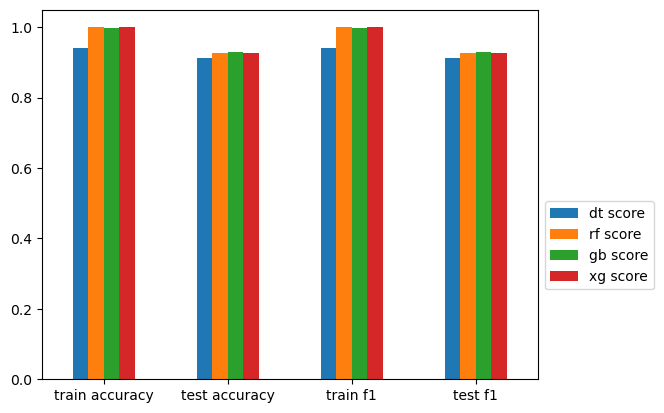

In [110]:
score_plot=scores_data.plot(y=['dt score','rf score','gb score','xg score'],kind='bar',rot=0)
score_plot.legend(loc='upper left', bbox_to_anchor=(1.0, 0.5))
plt.show()

* From the above plot we can say **Gradient Boost** model has the highest **f1 score** for test set
* XG Boost classifier has the highest accuracy and f1 score on training data set but not on test set
* Decision tree classifier is the least performing model on both train and test datasets
***

## 9. Feature Importance

In [111]:
decision_tree = DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_leaf=8,min_samples_split=15)
decision_tree.fit(X_train_scaled,y_train)
decision_tree.feature_importances_

array([0.00090034, 0.15917931, 0.19497185, 0.03151475, 0.00072146,
       0.00041295, 0.00328176, 0.00124316, 0.00654823, 0.01314519,
       0.06970049, 0.09401834, 0.25592544, 0.00364191, 0.14949802,
       0.01529679])

In [112]:
gradient_boost = GradientBoostingClassifier(n_estimators= 100, max_depth= 20, max_features= 'sqrt')
gradient_boost.fit(X_train_scaled,y_train)
gradient_boost.feature_importances_

array([0.05267365, 0.06927714, 0.06809298, 0.06394663, 0.04268285,
       0.08143408, 0.04744124, 0.08914029, 0.01262681, 0.02080526,
       0.06235935, 0.05887741, 0.08235238, 0.05746651, 0.16068241,
       0.03014102])

In [113]:
random_forest =RandomForestClassifier(n_estimators = 100, max_depth = 5,max_features= 'sqrt')
random_forest.fit(X_train_scaled,y_train)
random_forest.feature_importances_

array([0.06860934, 0.08696136, 0.07650674, 0.08407715, 0.06299791,
       0.07993933, 0.08865538, 0.07610245, 0.00059517, 0.00117266,
       0.02275601, 0.10610422, 0.09530669, 0.04663017, 0.09619418,
       0.00739123])

In [114]:
xg_boost = XGBClassifier(n_estimators = 100,max_depth = 5)
xg_boost.fit(X_train_scaled,y_train)
# xgb.plot_importance(xg_boost)
xg_boost.feature_importances_

array([0.09004854, 0.03398499, 0.08566523, 0.06281076, 0.0108072 ,
       0.        , 0.27321118, 0.        , 0.00533421, 0.00834399,
       0.03099071, 0.2614187 , 0.09655519, 0.02778169, 0.        ,
       0.01304758], dtype=float32)

In [115]:
importance_df = pd.DataFrame({"Feature": X.columns, 
                              "Decision Tree": decision_tree.feature_importances_,
                              "Random Forest": random_forest.feature_importances_,
                              "Gradient Boost": gradient_boost.feature_importances_,
                              "XG Boost": xg_boost.feature_importances_})
importance_df

,Feature,Decision Tree,Random Forest,Gradient Boost,XG Boost
0,Area,0.000900,0.068609,0.052674,0.090049
1,Perimeter,0.159179,0.086961,0.069277,0.033985
2,MajorAxisLength,0.194972,0.076507,0.068093,0.085665
3,MinorAxisLength,0.031515,0.084077,0.063947,0.062811
4,AspectRation,0.000721,0.062998,0.042683,0.010807
5,Eccentricity,0.000413,0.079939,0.081434,0.000000
6,ConvexArea,0.003282,0.088655,0.047441,0.273211
7,EquivDiameter,0.001243,0.076102,0.089140,0.000000
8,Extent,0.006548,0.000595,0.012627,0.005334
9,Solidity,0.013145,0.001173,0.020805,0.008344


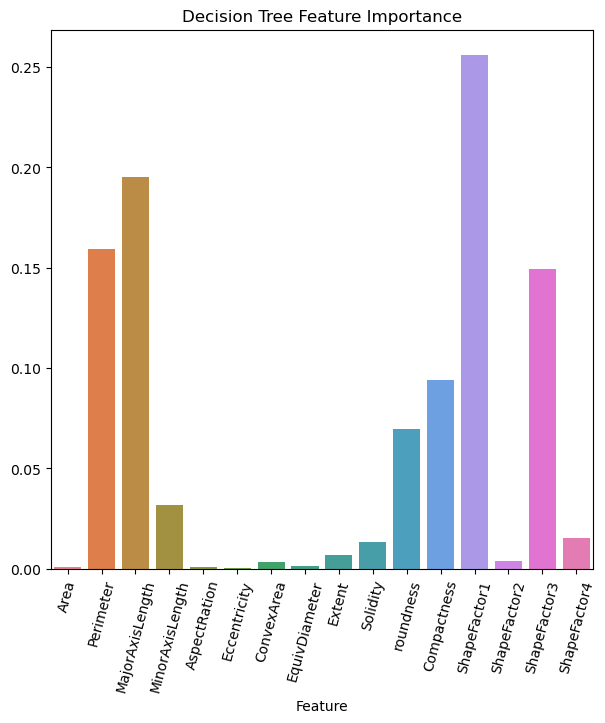

In [116]:
# Important features by Decision tree classifier
plt.figure(figsize=(7,7))
sns.barplot(x=importance_df['Feature'], y=importance_df['Decision Tree'], palette='husl')
plt.xticks(rotation=75)
plt.ylabel(None)
plt.title('Decision Tree Feature Importance')
plt.show()

* Shapfactor 1 followed by Major axis length,shapefactor 3 and perimeter are the top most important featues in the Decision tree classifier
***
***


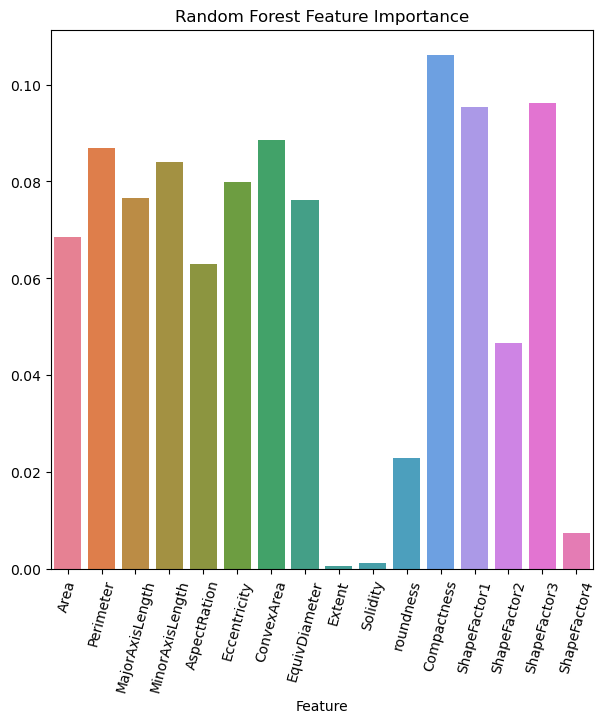

In [117]:
# Important features by Random forest classifier
plt.figure(figsize=(7,7))
sns.barplot(x=importance_df['Feature'], y=importance_df['Random Forest'], palette='husl')
plt.xticks(rotation=75)
plt.ylabel(None)
plt.title('Random Forest Feature Importance')
plt.show()

* Perimeter followed by Shapefactor 3,compactness, Minor axis length and shapefactor 4 are the top important features of Random forest model 
***
***

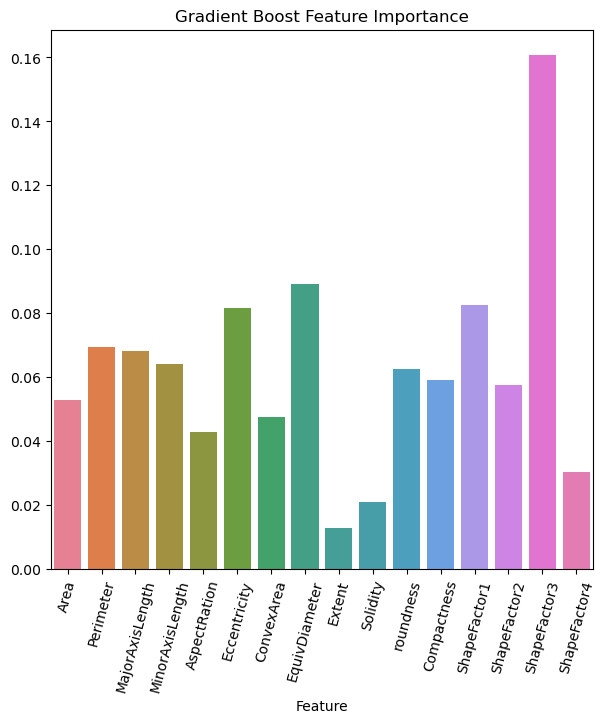

In [118]:
# Important features by Gradient boost classifier
plt.figure(figsize=(7,7))
sns.barplot(x=importance_df['Feature'], y=importance_df['Gradient Boost'], palette='husl')
plt.xticks(rotation=75)
plt.ylabel(None)
plt.title('Gradient Boost Feature Importance')
plt.show()

* Minor axis length followed by aspect ration, compactness and shapefactor 3 are the top important features for Gradient boost model
***
***

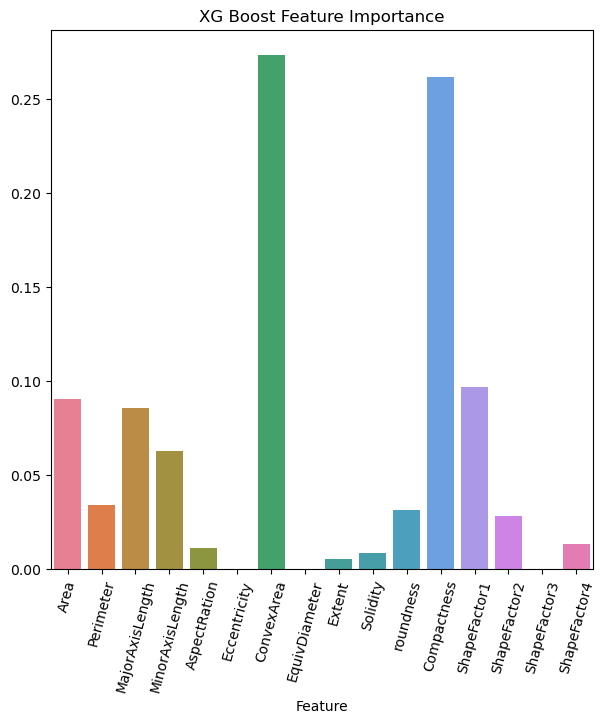

In [119]:
# Important features by XG boost classifier
plt.figure(figsize=(7,7))
sns.barplot(x=importance_df['Feature'], y=importance_df['XG Boost'], palette='husl')
plt.xticks(rotation=75)
plt.ylabel(None)
plt.title('XG Boost Feature Importance')
plt.show()

* Conver area and compactness are two top important features of XG boost model
***
***

* Out all the models **Random forest** has more features with greater importance which lead to better performing model on the test dataset